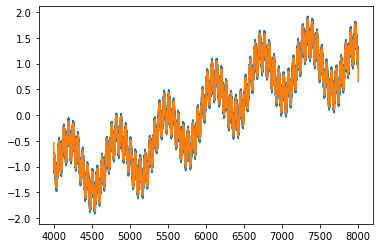

In [1]:
#Quick demo of convolving a spectrum to a given spectral resolution


import matplotlib.pyplot as plt
import numpy as np

from astropy.convolution import convolve, Gaussian1DKernel
from scipy.interpolate import interp1d


#Setup
R = 20000 #R = lambda / deltaLambda
referenceWavelength = 6000
oversample = 5  #points per deltaLambda at reference wavelength

#Create a high-resolution model spectrum
step = 0.01
modelWavelength = np.arange(4000,8000,step)
modelFlux = np.sum([np.sin(modelWavelength * (10 ** (i-3)) + (np.random.random() * 2 * np.pi)) * (2 ** -i) for i in range(5)], axis=0)
modelFlux += np.random.normal(loc=0, scale=np.std(modelFlux) / 100, size=len(modelFlux))

#Convolve over Gaussian kernel
deltaLambda = referenceWavelength / R
width = deltaLambda / 2 / step #R is the FWHM, but the Gaussian stdev is approximately the half-width
kernel = Gaussian1DKernel(width)
convolvedFlux = convolve(modelFlux, kernel)

#Downsample to generate output
interpolator = interp1d(x=modelWavelength, y=convolvedFlux, kind='linear')
outputWavelength = np.arange(min(modelWavelength), max(modelWavelength), deltaLambda/oversample)
outputFlux = interpolator(outputWavelength)

plt.plot(modelWavelength, modelFlux)
plt.plot(outputWavelength, outputFlux)


(-1.5, -0.6)

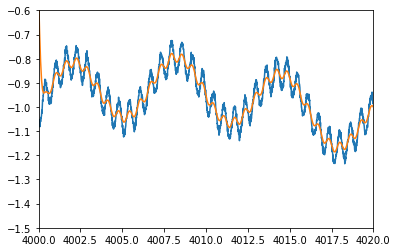

In [6]:
plt.plot(modelWavelength, modelFlux)
plt.plot(outputWavelength, outputFlux)
plt.xlim(4000,4020)
plt.ylim(-1.5,-0.6)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from astropy.convolution import convolve, Gaussian1DKernel
from scipy.interpolate import interp1d
from astropy.io import fits
from astropy import units as u
import numpy as np
from matplotlib import pyplot as plt
from astropy.visualization import quantity_support
from pydl.goddard.astro import airtovac, vactoair
from astropy.io import fits
from astropy import units as u
import numpy as np
from matplotlib import pyplot as plt
from astropy.visualization import quantity_support
from specutils.manipulation import FluxConservingResampler, LinearInterpolatedResampler, SplineInterpolatedResampler
from specutils import Spectrum1D

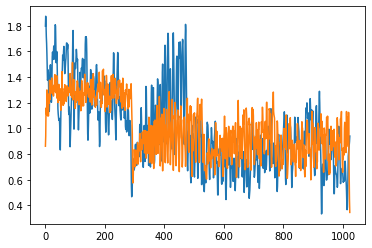

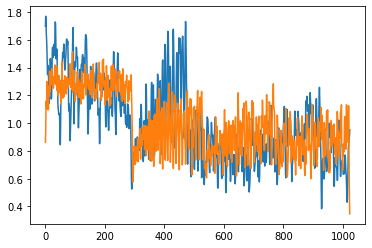

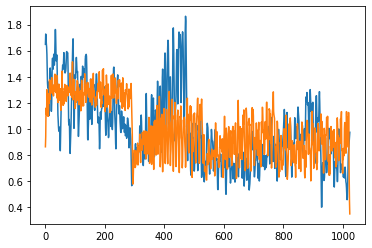

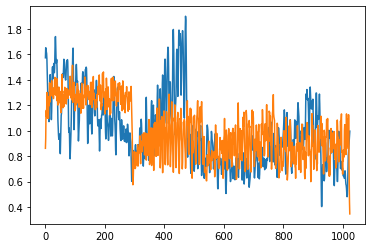

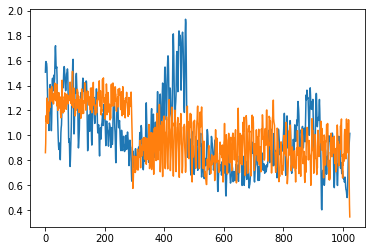

...

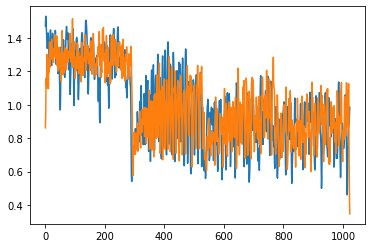

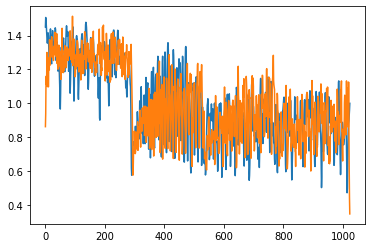

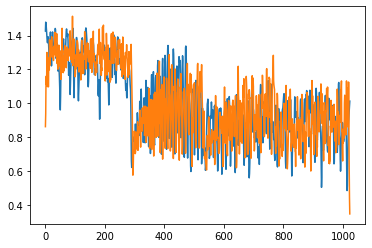

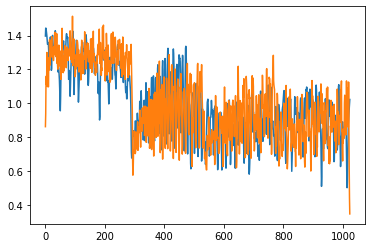

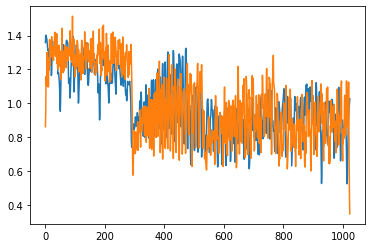

In [61]:
path = 'C:/Users/Admin/sor/'
with fits.open('Combined28New.fits') as hdul:
    dataActual = hdul[0].data
count = 0
crossCor = []
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
with open(path+'files') as file:
    for line in file:
        fluxcon = FluxConservingResampler()
        line = line.strip('\n')
        data = pd.read_table(path+line, header=2, names=['wave','flux'],delim_whitespace=True)
        flux = np.array(np.flip(data['flux'][99051:133923]))  * u.Unit('erg cm-2 s-1 AA-1')  
        wave = 10000*np.flip(np.array(data['wave'][99051:133923]))* u.AA
        fluxUnitless = np.array(np.flip(data['flux'][99051:133923]))
        waveUnitless = 10000*np.flip(np.array(data['wave'][99051:133923]))
        R = 8900 #R = lambda / deltaLambda
        referenceWavelength = 23000
        oversample = 11  #points per deltaLambda at reference wavelength
        deltaLambda = referenceWavelength / R
        width = deltaLambda / 2 / 0.10499999999956344 #R is the FWHM, but the Gaussian stdev is approximately the half-width
        kernel = Gaussian1DKernel(width)
        convolvedFlux = convolve(fluxUnitless, kernel)
        interpolator = interp1d(x=waveUnitless, y=convolvedFlux, kind='linear')
        outputWavelength = np.arange(min(waveUnitless), max(waveUnitless), deltaLambda/oversample)
        outputFlux = interpolator(outputWavelength)
        fluxx = outputFlux * u.Unit('erg cm-2 s-1 AA-1') 
        wavve = outputWavelength* u.AA
        input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
        new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
        arrayToComp = new_spec_fluxcon.flux.value.tolist()
        arrayToComp = arrayToComp/np.mean(arrayToComp)
        plt.plot(arrayToComp)
        plt.plot(dataActual**3)
        plt.show()
        if count == 0:
            crossCor = np.correlate(arrayToComp,dataActual**3, mode='same')[470:550]
        else:
            crossCor = np.vstack((crossCor, np.correlate(arrayToComp,dataActual**3, mode='same')[470:550]))
        count = count + 1
        
        #forwardThis ^ 

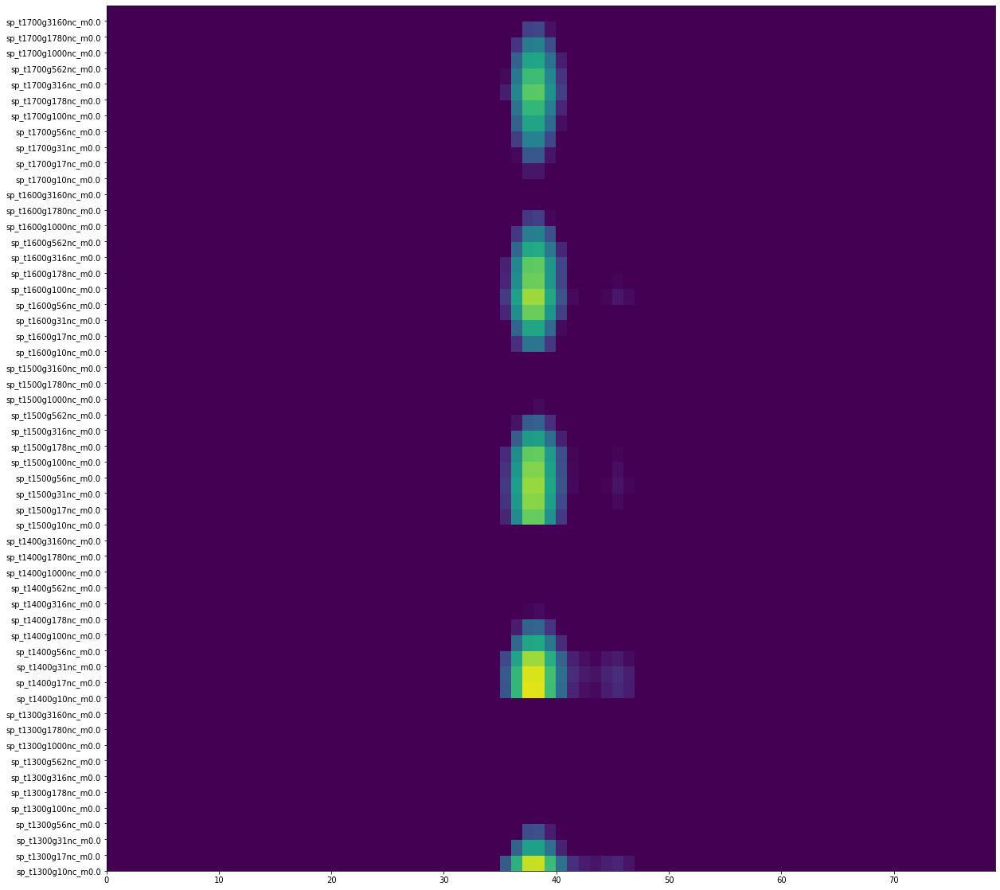

In [67]:
#plt.imshow(crossCor)
names = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        names.append(line)
fig, axs = plt.subplots(1, 1,
                        gridspec_kw={'hspace': 0.1, 'wspace': 0}, figsize=(20,20))
X,Y = np.meshgrid(np.linspace(0,79,80), np.linspace(0,55,56))

axs.pcolormesh(X,Y,crossCor,vmin=1055, vmax=1070)
axs.set_yticks(np.linspace(0, 54, 55))
axs.set_yticklabels(names)
#axs.set_yticklabels(names)

plt.savefig('CrossCorrTemplates.pdf')

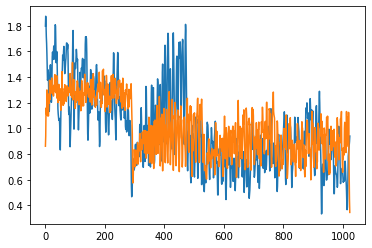

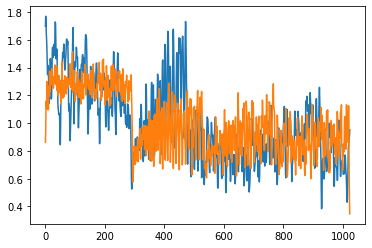

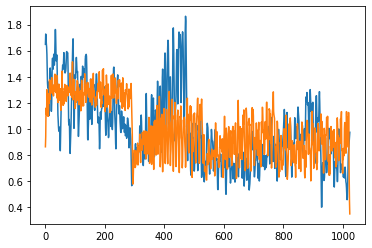

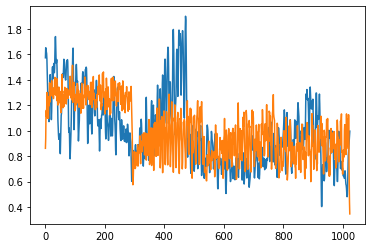

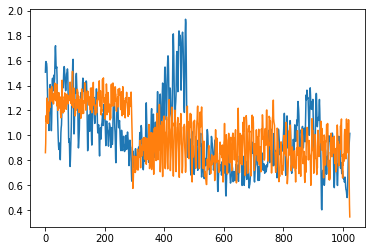

...

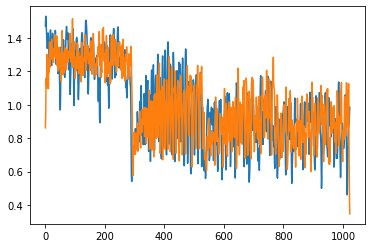

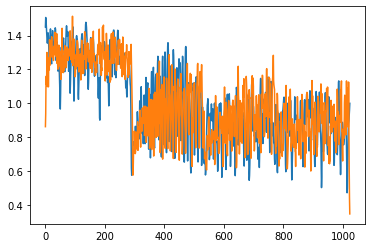

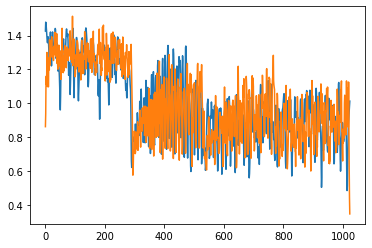

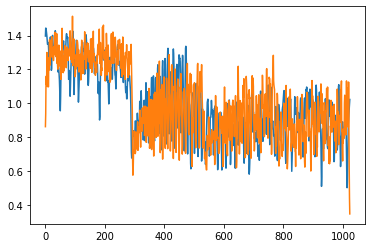

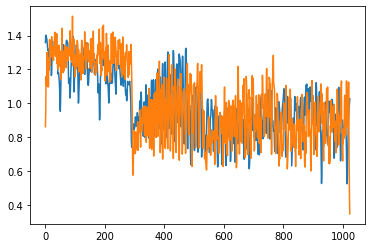

In [2]:
path = 'C:/Users/Admin/sor/'
with fits.open('Combined28New.fits') as hdul:
    dataActual = hdul[0].data
count = 0
crossCor = []
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
with open(path+'files') as file:
    for line in file:
        fluxcon = FluxConservingResampler()
        line = line.strip('\n')
        data = pd.read_table(path+line, header=2, names=['wave','flux'],delim_whitespace=True)
        flux = np.array(np.flip(data['flux'][99051:133923]))  * u.Unit('erg cm-2 s-1 AA-1')  
        wave = 10000*np.flip(np.array(data['wave'][99051:133923]))* u.AA
        fluxUnitless = np.array(np.flip(data['flux'][99051:133923]))
        waveUnitless = 10000*np.flip(np.array(data['wave'][99051:133923]))
        R = 8900 #R = lambda / deltaLambda
        referenceWavelength = 23000
        oversample = 11  #points per deltaLambda at reference wavelength
        deltaLambda = referenceWavelength / R
        width = deltaLambda / 2 / 0.10499999999956344 #R is the FWHM, but the Gaussian stdev is approximately the half-width
        kernel = Gaussian1DKernel(width)
        convolvedFlux = convolve(fluxUnitless, kernel)
        interpolator = interp1d(x=waveUnitless, y=convolvedFlux, kind='linear')
        outputWavelength = np.arange(min(waveUnitless), max(waveUnitless), deltaLambda/oversample)
        outputFlux = interpolator(outputWavelength)
        fluxx = outputFlux * u.Unit('erg cm-2 s-1 AA-1') 
        wavve = outputWavelength* u.AA
        input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
        new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
        arrayToComp = new_spec_fluxcon.flux.value.tolist()
        arrayToComp = arrayToComp/np.mean(arrayToComp)
        plt.plot(arrayToComp)
        plt.plot(dataActual**3)
        plt.show()
        if count == 0:
            crossCor = np.correlate(arrayToComp,dataActual**3, mode='same')[470:550]
            crossCor = (crossCor-np.min(crossCor))/(np.max(crossCor)-np.min(crossCor))
        else:
            temp = np.correlate(arrayToComp,dataActual**3, mode='same')[470:550]
            temp = (temp-np.min(temp))/(np.max(temp)-np.min(temp))
            crossCor = np.vstack((crossCor, temp))
        count = count + 1
        
        #forwardThis ^ 

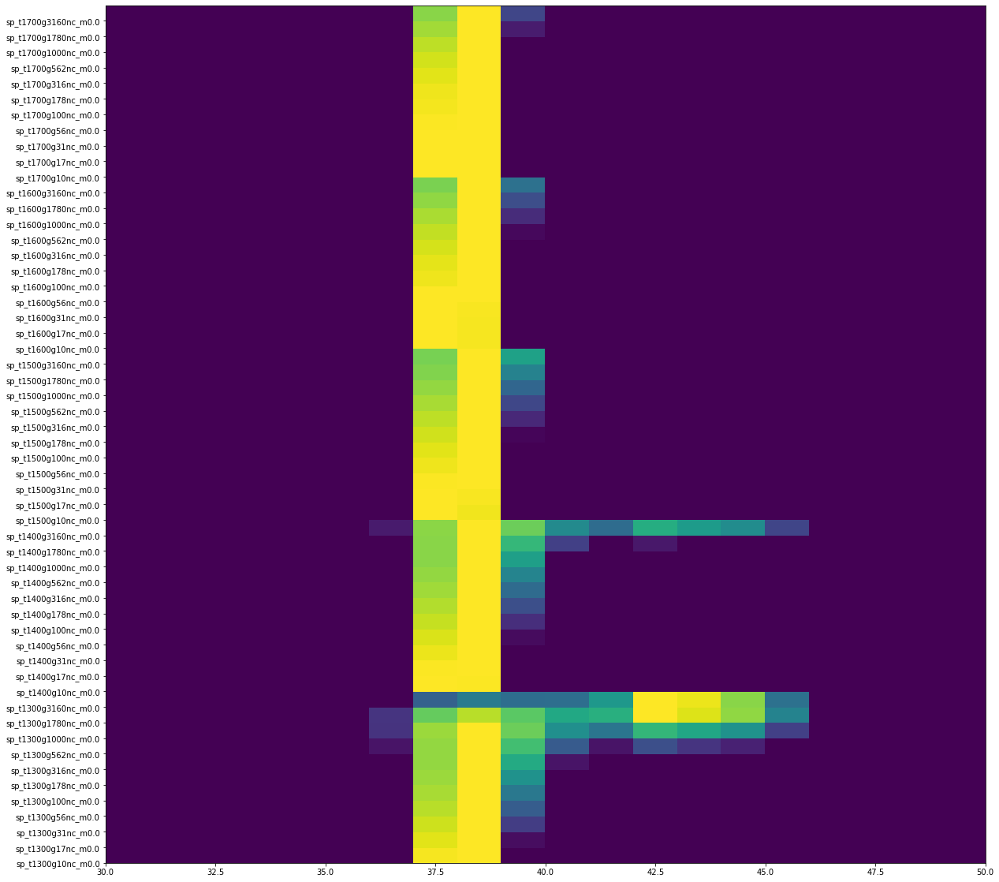

In [5]:
#plt.imshow(crossCor)
names = []
with open(path+'files') as file:
    for line in file:
        line = line.strip('\n')
        names.append(line)
fig, axs = plt.subplots(1, 1,
                        gridspec_kw={'hspace': 0.1, 'wspace': 0}, figsize=(20,20))
X,Y = np.meshgrid(np.linspace(0,79,80), np.linspace(0,55,56))

axs.pcolormesh(X,Y,crossCor,vmin=0.95, vmax=1)
axs.set_yticks(np.linspace(0, 54, 55))
axs.set_yticklabels(names)
#axs.set_yticklabels(names)
axs.set_xlim(30,50)
plt.savefig('CrossCorrKurtosis.pdf')

(30, 50)

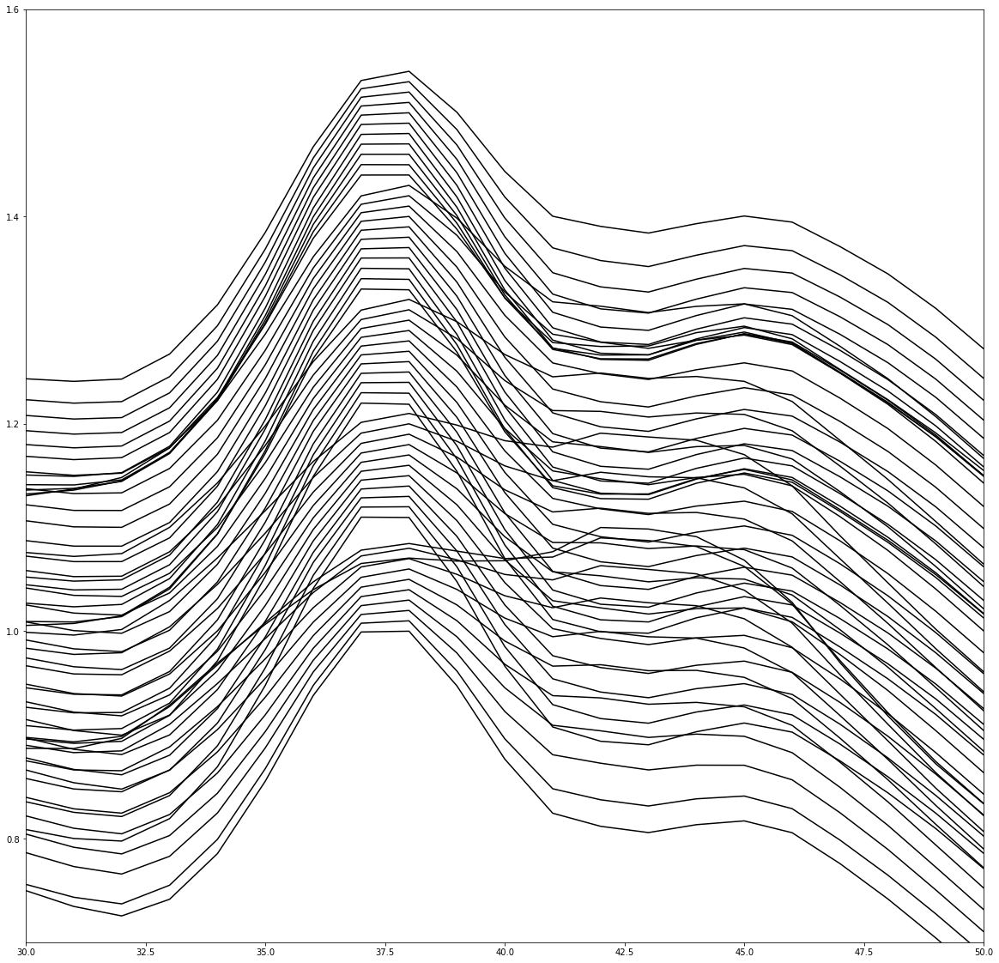

In [17]:

fig, axs = plt.subplots(1, 1,
                        gridspec_kw={'hspace': 0.1, 'wspace': 0}, figsize=(20,20))
count = 0
for el in crossCor:
    axs.plot(el+count*0.01, c='k')
    count = count + 1
#axs.pcolormesh(X,Y,crossCor,vmin=0.95, vmax=1)
#axs.set_yticks(np.linspace(0, 54, 55))
#axs.set_yticklabels(names)
#axs.set_yticklabels(names)
axs.set_ylim(0.7,1.6)
axs.set_xlim(30,50)
#plt.savefig('CrossCorrKurtosisLine.pdf')

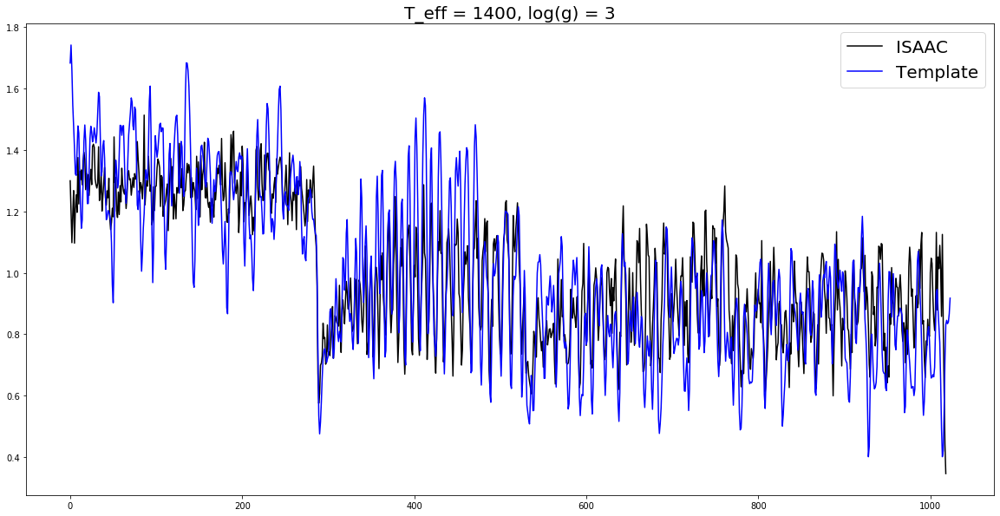

In [79]:
plt.figure(figsize=(20,10))
plt.plot(dataActual[5:]**3, c='k', label='ISAAC')


new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA


data = pd.read_table('sor/sp_t1400g10nc_m0.0', header=2, names=['wave','flux'],delim_whitespace=True)
fluxx = np.array(np.flip(data['flux'][99051:133923]))  * u.Unit('erg cm-2 s-1 AA-1')  
wavve = 10000*np.flip(np.array(data['wave'][99051:133923]))* u.AA
fluxUnitless = np.array(np.flip(data['flux'][99051:133923]))
waveUnitless = 10000*np.flip(np.array(data['wave'][99051:133923]))

fluxcon = FluxConservingResampler()
#Quick demo of convolving a spectrum to a given spectral resolution


#Setup
R = 8900 #R = lambda / deltaLambda
referenceWavelength = 23000
oversample = 11  #points per deltaLambda at reference wavelength


#Convolve over Gaussian kernel
deltaLambda = referenceWavelength / R
width = deltaLambda / 2 / 0.10499999999956344 #R is the FWHM, but the Gaussian stdev is approximately the half-width
kernel = Gaussian1DKernel(width)
convolvedFlux = convolve(fluxUnitless, kernel)

#Downsample to generate output
interpolator = interp1d(x=waveUnitless, y=convolvedFlux, kind='linear')
outputWavelength = np.arange(min(waveUnitless), max(waveUnitless), deltaLambda/oversample)
outputFlux = interpolator(outputWavelength)


fluxx = outputFlux * u.Unit('erg cm-2 s-1 AA-1') 
wavve = outputWavelength* u.AA

input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
arrayToComp = new_spec_fluxcon.flux.value.tolist()
arrayToComp = arrayToComp/np.mean(arrayToComp)
plt.plot(arrayToComp, c='b',label='Template')
plt.legend(loc='best',fontsize=20)
plt.title('T_eff = 1400, log(g) = 3', fontsize=20)
plt.savefig('CrossCorrBest.pdf')

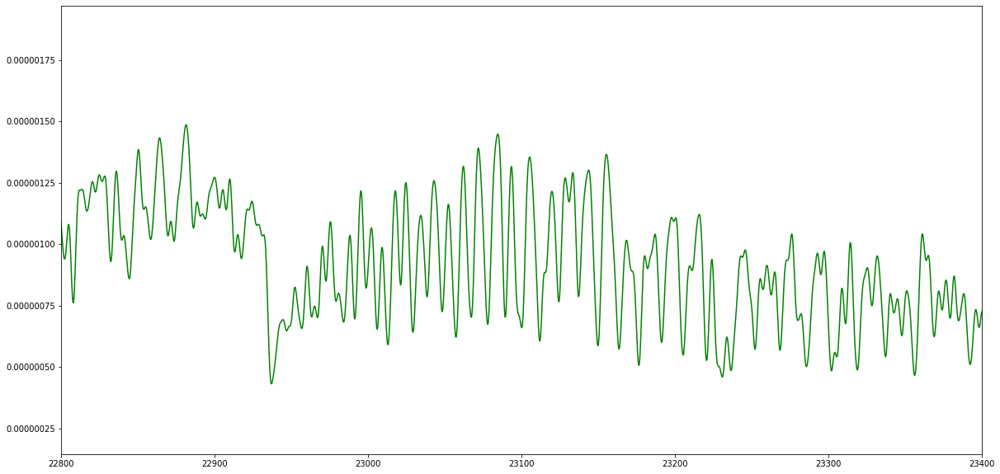

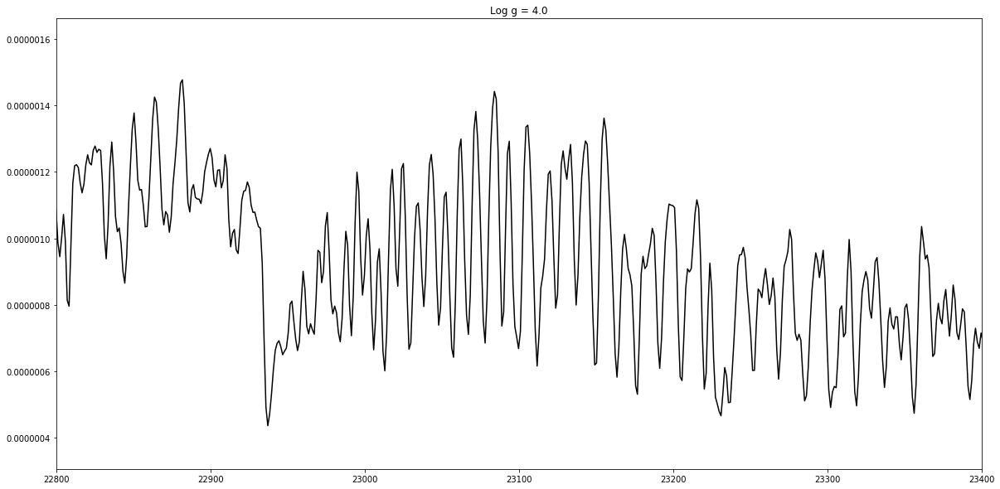

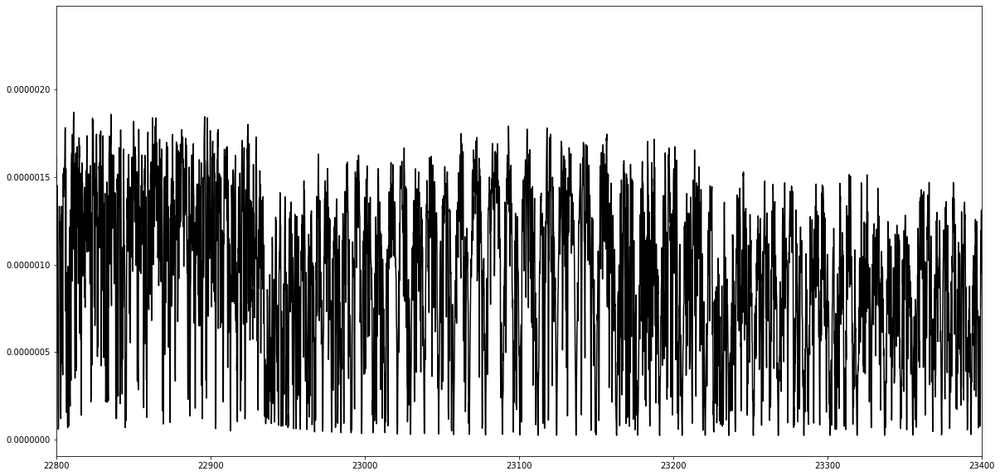

In [3]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
#data = pd.read_table('sor/sp_t1400g10nc_m0.0', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
data = pd.read_table('sor/sp_t1400g10nc_m0.0', header=2, names=['wave','flux'],delim_whitespace=True)
fluxx = np.array(np.flip(data['flux'][99051:133923]))  * u.Unit('erg cm-2 s-1 AA-1')  
wavve = 10000*np.flip(np.array(data['wave'][99051:133923]))* u.AA
fluxUnitless = np.array(np.flip(data['flux'][99051:133923]))
waveUnitless = 10000*np.flip(np.array(data['wave'][99051:133923]))

#Quick demo of convolving a spectrum to a given spectral resolution


#Setup
R = 8900 #R = lambda / deltaLambda
referenceWavelength = 23000
oversample = 11  #points per deltaLambda at reference wavelength


#Convolve over Gaussian kernel
deltaLambda = referenceWavelength / R
width = deltaLambda / 2 / 0.10499999999956344 #R is the FWHM, but the Gaussian stdev is approximately the half-width
kernel = Gaussian1DKernel(width)
convolvedFlux = convolve(fluxUnitless, kernel)

#Downsample to generate output
interpolator = interp1d(x=waveUnitless, y=convolvedFlux, kind='linear')
outputWavelength = np.arange(min(waveUnitless), max(waveUnitless), deltaLambda/oversample)
outputFlux = interpolator(outputWavelength)

plt.figure(figsize=(20,10))
plt.plot(outputWavelength, outputFlux, c='g')
plt.xlim(22800,23400)
plt.show()

fluxx = outputFlux * u.Unit('erg cm-2 s-1 AA-1') 
wavve = outputWavelength* u.AA

input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 4.0')
plt.figure(figsize=(20,10))
plt.plot(10000*data['wave'][99051:133923], data['flux'][99051:133923], 'k')
plt.xlim(22800,23400)



dat = np.vstack((new_spec_fluxcon.spectral_axis.value.tolist(), new_spec_fluxcon.flux.value.tolist()))
dat = dat.T
np.savetxt('SonoraBestCC.dat', dat, delimiter = '\t')

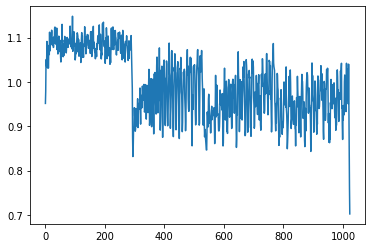

In [13]:
with fits.open('Combined28New.fits') as hdul:
    dataActual = hdul[0].data
plt.plot(dataActual)

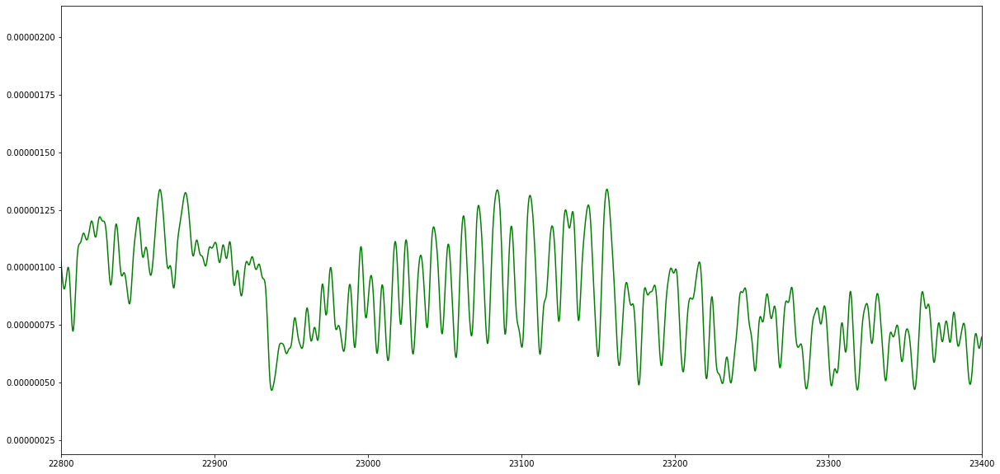

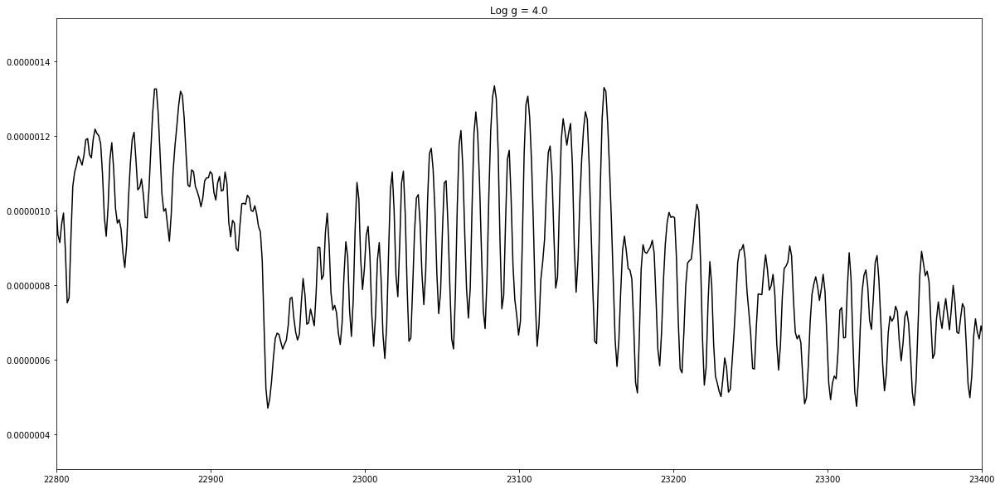

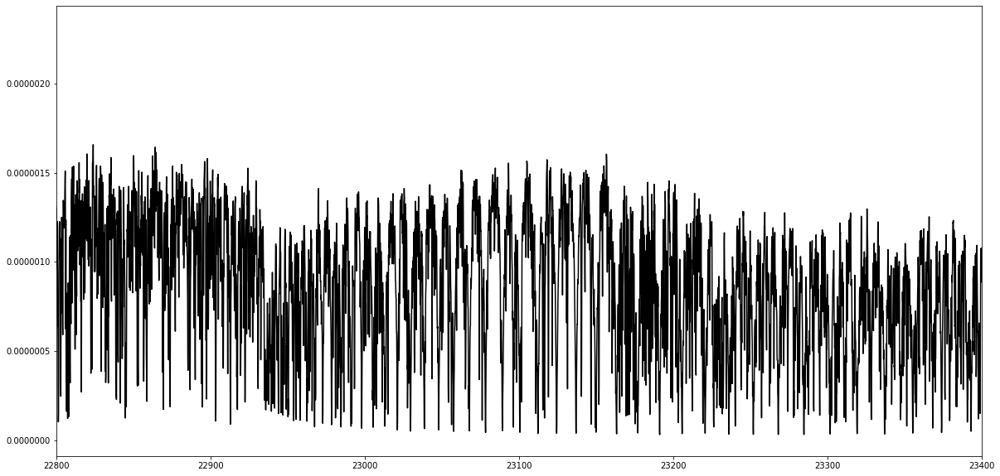

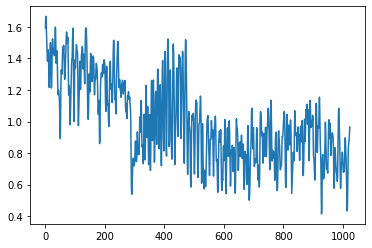

In [23]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('sp_t1500g100nc_m0.0', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
fluxx  = np.array(np.flip(data['flux'])) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = 10000*np.flip(np.array(data['wave']))* u.AA

fluxUnitless = np.array(np.flip(data['flux']))
waveUnitless = 10000*np.flip(np.array(data['wave']))

#Quick demo of convolving a spectrum to a given spectral resolution


#Setup
R = 8900 #R = lambda / deltaLambda
referenceWavelength = 23000
oversample = 11  #points per deltaLambda at reference wavelength


#Convolve over Gaussian kernel
deltaLambda = referenceWavelength / R
width = deltaLambda / 2 / 0.10499999999956344 #R is the FWHM, but the Gaussian stdev is approximately the half-width
kernel = Gaussian1DKernel(width)
convolvedFlux = convolve(fluxUnitless, kernel)

#Downsample to generate output
interpolator = interp1d(x=waveUnitless, y=convolvedFlux, kind='linear')
outputWavelength = np.arange(min(waveUnitless), max(waveUnitless), deltaLambda/oversample)
outputFlux = interpolator(outputWavelength)

plt.figure(figsize=(20,10))
plt.plot(outputWavelength, outputFlux, c='g')
plt.xlim(22800,23400)
plt.show()

fluxx = outputFlux * u.Unit('erg cm-2 s-1 AA-1') 
wavve = outputWavelength* u.AA

input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 4.0')
plt.figure(figsize=(20,10))
plt.plot(10000*data['wave'], data['flux'], 'k')
plt.xlim(22800,23400)
plt.show()
arrayToComp = new_spec_fluxcon.flux.value.tolist()
arrayToComp = arrayToComp/np.mean(arrayToComp)
plt.plot(arrayToComp)

(400, 600)

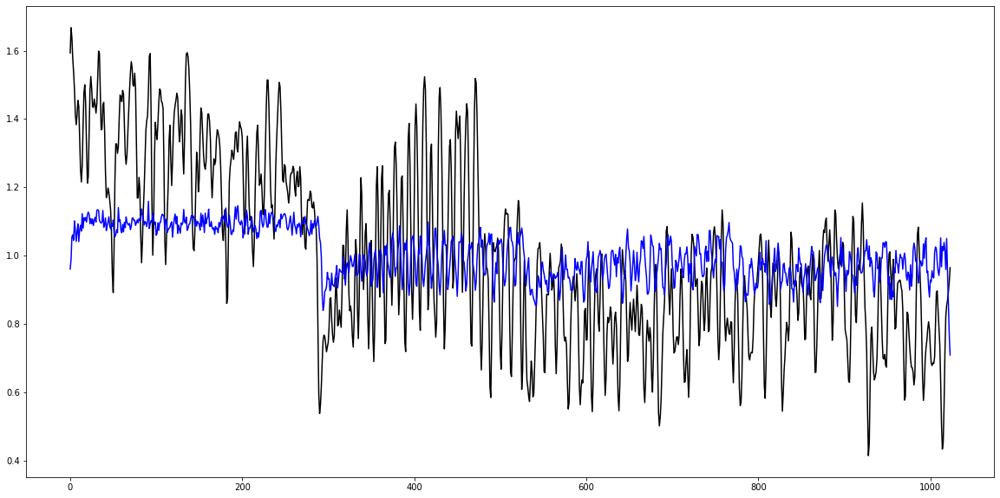

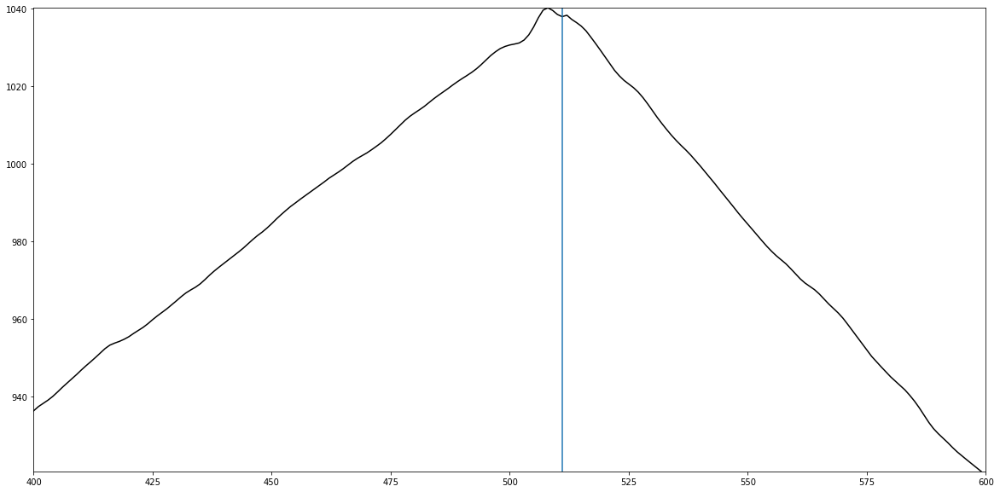

In [24]:
plt.figure(figsize=(20,10))
plt.plot(arrayToComp, c='k')
plt.plot(dataActual/np.median(dataActual), c='b')
corrArray = np.correlate(arrayToComp,dataActual/np.median(dataActual), mode='same')
plt.figure(figsize=(20,10))
plt.plot(corrArray, c='k')
plt.plot([511,511],[min(corrArray[400:600]), max(corrArray)])
plt.ylim(min(corrArray[400:600]), max(corrArray))
plt.xlim(400,600)

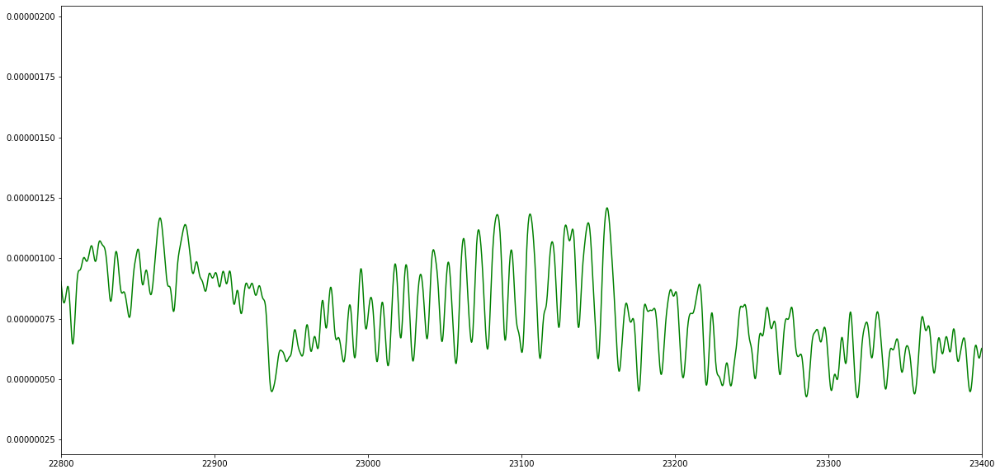

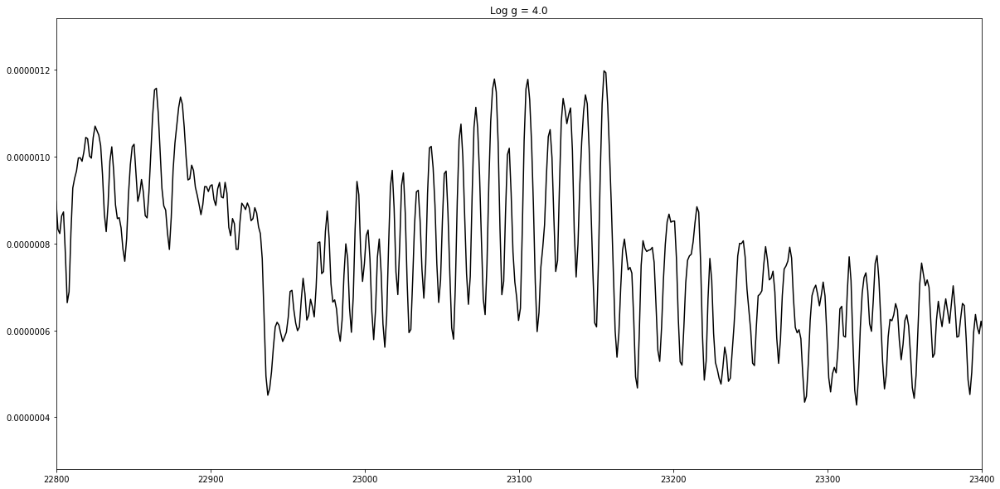

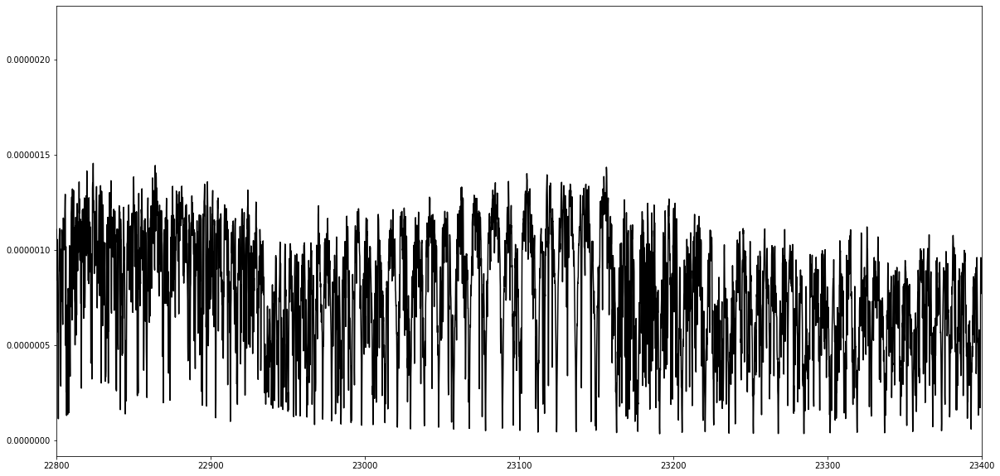

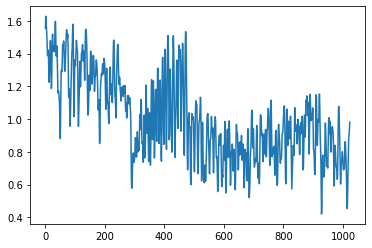

(400, 600)

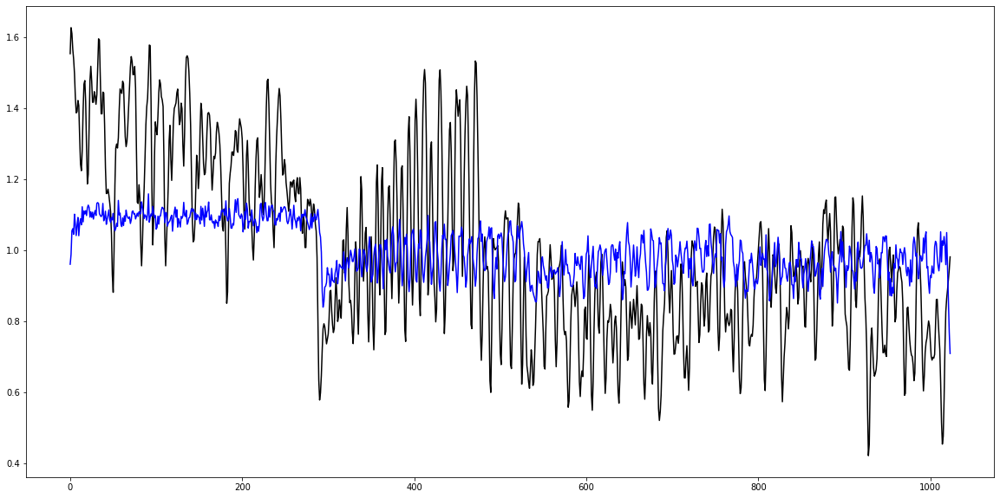

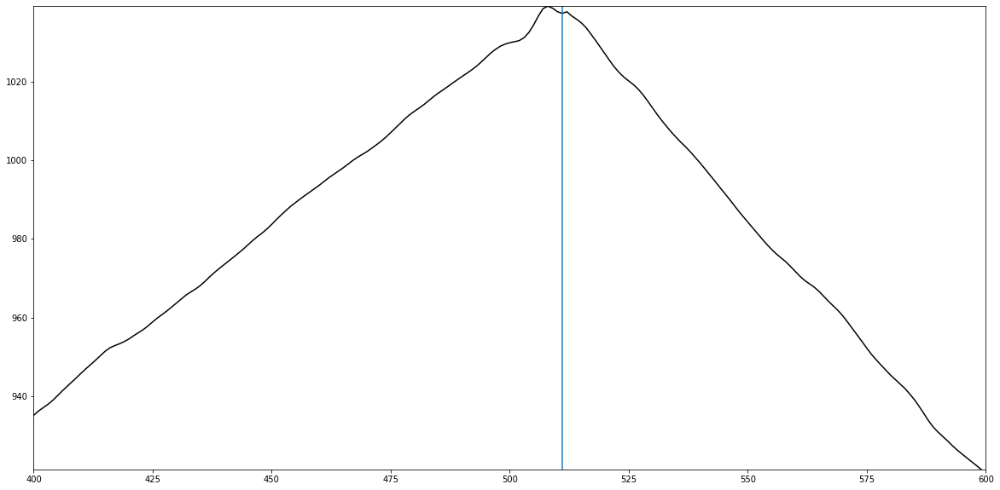

In [26]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('sp_t1500g178nc_m0.0', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
fluxx  = np.array(np.flip(data['flux'])) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = 10000*np.flip(np.array(data['wave']))* u.AA

fluxUnitless = np.array(np.flip(data['flux']))
waveUnitless = 10000*np.flip(np.array(data['wave']))

#Quick demo of convolving a spectrum to a given spectral resolution


#Setup
R = 8900 #R = lambda / deltaLambda
referenceWavelength = 23000
oversample = 11  #points per deltaLambda at reference wavelength


#Convolve over Gaussian kernel
deltaLambda = referenceWavelength / R
width = deltaLambda / 2 / 0.10499999999956344 #R is the FWHM, but the Gaussian stdev is approximately the half-width
kernel = Gaussian1DKernel(width)
convolvedFlux = convolve(fluxUnitless, kernel)

#Downsample to generate output
interpolator = interp1d(x=waveUnitless, y=convolvedFlux, kind='linear')
outputWavelength = np.arange(min(waveUnitless), max(waveUnitless), deltaLambda/oversample)
outputFlux = interpolator(outputWavelength)

plt.figure(figsize=(20,10))
plt.plot(outputWavelength, outputFlux, c='g')
plt.xlim(22800,23400)
plt.show()

fluxx = outputFlux * u.Unit('erg cm-2 s-1 AA-1') 
wavve = outputWavelength* u.AA

input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 4.0')
plt.figure(figsize=(20,10))
plt.plot(10000*data['wave'], data['flux'], 'k')
plt.xlim(22800,23400)
plt.show()
arrayToComp = new_spec_fluxcon.flux.value.tolist()
arrayToComp = arrayToComp/np.mean(arrayToComp)
plt.plot(arrayToComp)
plt.show()
plt.figure(figsize=(20,10))
plt.plot(arrayToComp, c='k')
plt.plot(dataActual/np.median(dataActual), c='b')
corrArray = np.correlate(arrayToComp,dataActual/np.median(dataActual), mode='same')
plt.figure(figsize=(20,10))
plt.plot(corrArray, c='k')
plt.plot([511,511],[min(corrArray[400:600]), max(corrArray)])
plt.ylim(min(corrArray[400:600]), max(corrArray))
plt.xlim(400,600)

In [24]:
def sdssFunction(vacWav):
    return vacWav / (1 + 2.735182e-4 + (131.4182/(vacWav**2)) + (2.76249e-8 / (vacWav**4)))

In [26]:
trial = np.array([23000,23100])
#trial = np.array([4800,5000])
print(vactoair(trial))

print(sdssFunction(trial))

[ 22993.72477653  23093.69755093]
[ 22993.7050909   23093.67777128]


In [13]:
import sys
!{sys.executable} -m pip install pydl

  Created wheel for pydl: filename=pydl-0.7.0-py3-none-any.whl size=572157 sha256=3df157e2ec5dbfcf1927f75882aeac99e614731094e69612cc7f2903bb00ca39
  Stored in directory: c:\users\admin\appdata\local\pip\cache\wheels\14\d4\f2\c6c5db78e90a24b8deae457a4c07e8231ccf41b8eae90f1f85
Successfully built pydl


0.49950000000000006


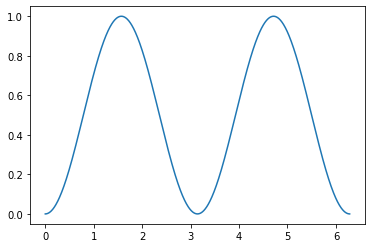

In [3]:
x = np.linspace(0,2*np.pi,1000)
y = np.sin(x)**2
plt.plot(x,y)
print(np.mean(y))

#100km-s

In [15]:
data = pd.read_table('lte03000-3.00-0.0.7', header=None, names=['wave','flux', 'pass','p','a','g','q','w','e','r','t','y','u','i','o'],delim_whitespace=True)

FileNotFoundError: [Errno 2] File lte03000-3.00-0.0.7 does not exist: 'lte03000-3.00-0.0.7'

In [5]:
dat = np.vstack((data['wave'], data['flux']))
dat = dat.T
np.savetxt('PhoenixTest.dat', dat, delimiter = '\t')

NameError: name 'data' is not defined

In [6]:
wave = data['wave'][111000:187000]
flux = data['flux'][111000:187000]

NameError: name 'data' is not defined

In [27]:
wave

111000    1.049536000000000D+04
111001    1.049552000000000D+04
111002    1.049568000000000D+04
111003    1.049584000000000D+04
111004    1.049600000000000D+04
                  ...          
186995    3.810222500000000D+04
186996    3.810362500000000D+04
186997    3.810502500000000D+04
186998    3.810642500000000D+04
186999    3.810782500000000D+04
Name: wave, Length: 76000, dtype: object

In [28]:
wave = wave.str.replace('D','e')

In [30]:
flux = flux.str.replace('D','e')

In [29]:
wave = wave.to_numpy(dtype=float)

In [31]:
flux = flux.to_numpy(dtype=float)

In [4]:
dat = np.vstack((wave, flux))
dat = dat.T
np.savetxt('PhoenixTest.dat', dat, delimiter = '\t')

NameError: name 'wave' is not defined

In [2]:
indata = np.loadtxt("PhoenixTest.dat", usecols=(0,1))
wave = indata[:,0]
flux = indata[:,1]

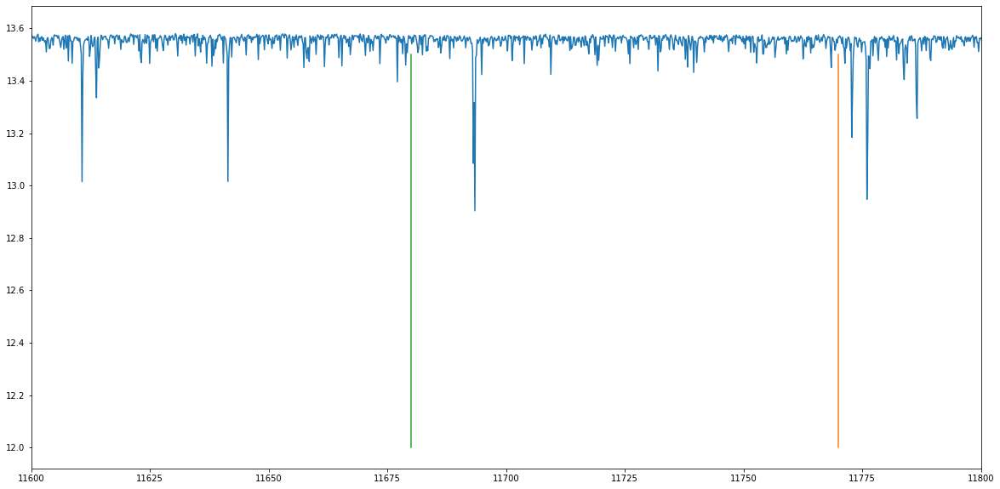

In [15]:
plt.figure(figsize=(20,10))
plt.plot(wave,flux)
plt.xlim(11600,11800)
plt.plot([11770,11770],[12,13.5])
plt.plot([11680,11680],[12,13.5])

(22000, 24000)

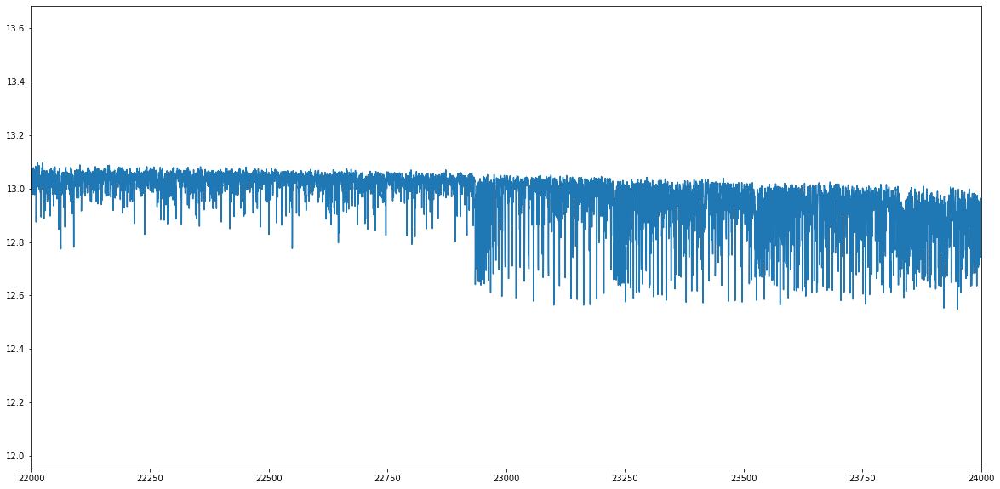

In [8]:
plt.figure(figsize=(20,10))
plt.plot(wave,flux)
plt.xlim(22000,24000)

In [55]:
dataTest = pd.read_table('settlTest.txt', header=None, names=['wave','flux'],delim_whitespace=True)

In [56]:
testW = dataTest['wave']
testF = dataTest['flux']

In [31]:
dataNew = pd.read_table('phoenix5.5.txt', header=None, names=['wave','flux'],delim_whitespace=True)

(22800, 23400)

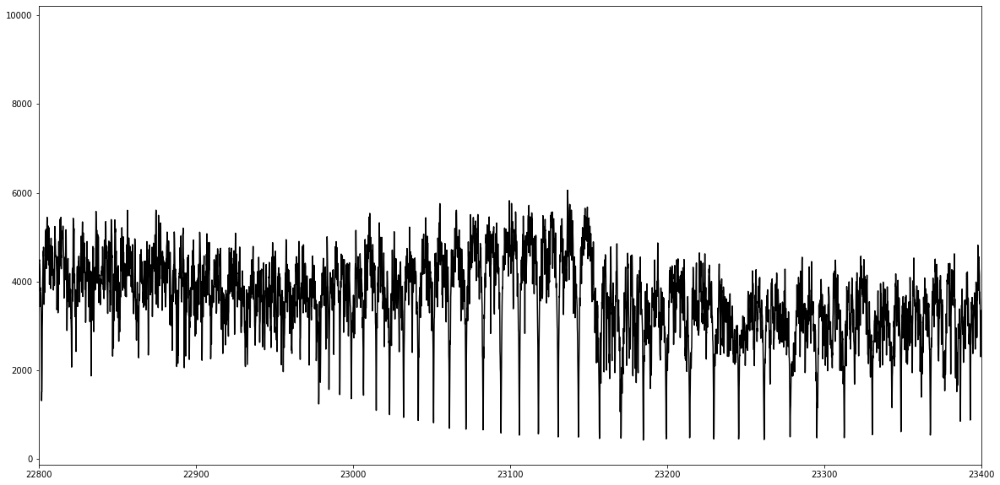

In [32]:
plt.figure(figsize=(20,10))
plt.plot(dataNew['wave'], dataNew['flux'], 'k')
plt.xlim(22800,23400)

In [29]:
dataNew = pd.read_table('phoenix5.0.txt', header=None, names=['wave','flux'],delim_whitespace=True)

(22800, 23400)

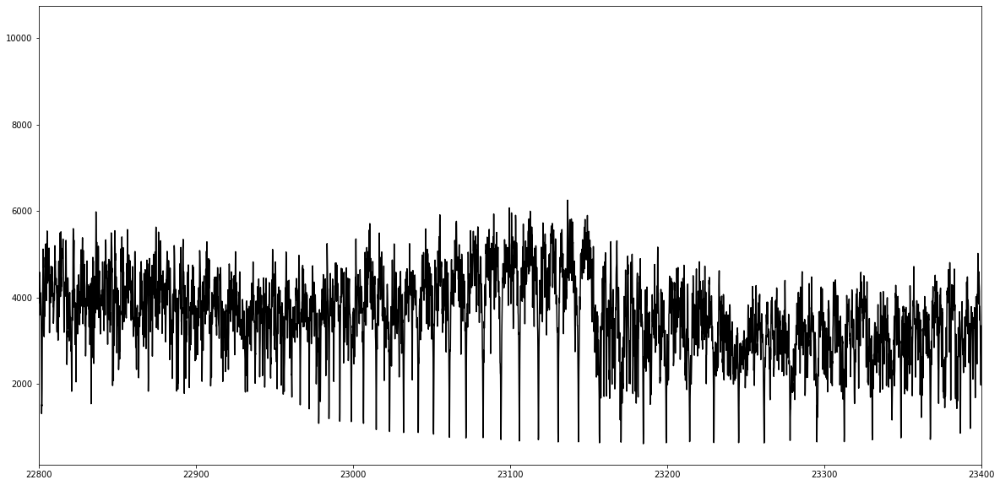

In [30]:
plt.figure(figsize=(20,10))
plt.plot(dataNew['wave'], dataNew['flux'], 'k')
plt.xlim(22800,23400)

In [33]:
dataNew = pd.read_table('phoenix4.5.txt', header=None, names=['wave','flux'],delim_whitespace=True)

(22800, 23400)

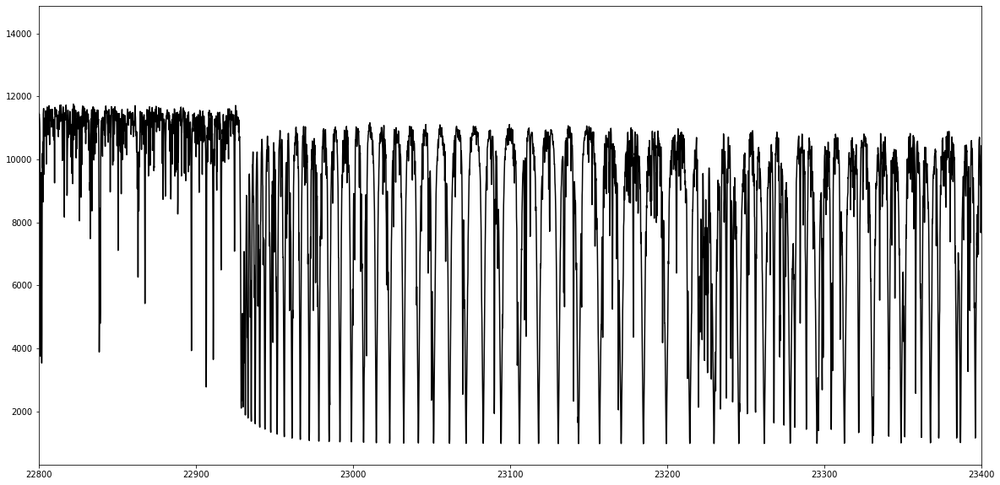

In [34]:
plt.figure(figsize=(20,10))
plt.plot(dataNew['wave'], dataNew['flux'], 'k')
plt.xlim(22800,23400)

In [35]:
data = pd.read_table('UpdatedPhoenix.txt', header=None, names=['wave','flux'],delim_whitespace=True)

(22800, 23400)

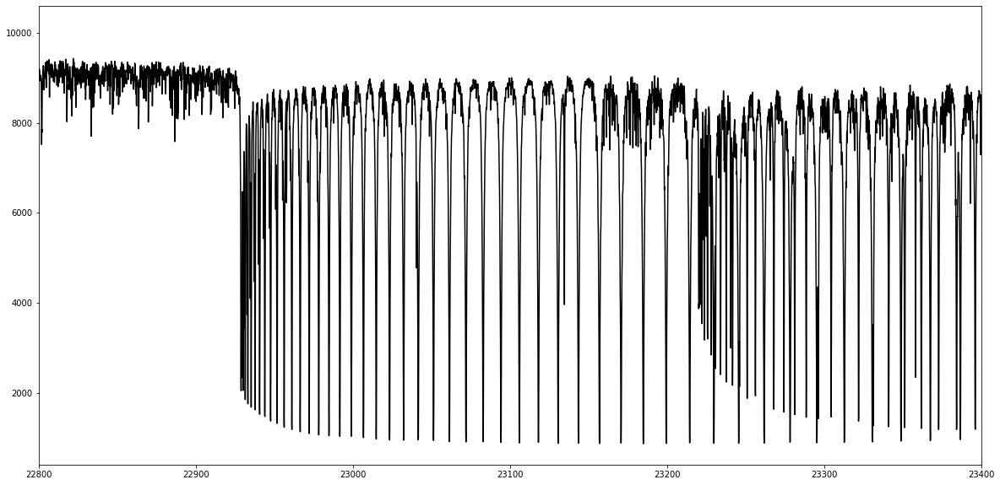

In [36]:
data = pd.read_table('UpdatedPhoenix.txt', header=None, names=['wave','flux'],delim_whitespace=True)
plt.figure(figsize=(20,10))
plt.plot(data['wave'], data['flux'], 'k')
plt.xlim(22800,23400)

In [61]:
data = pd.read_table('GD1400Model.txt', header=None, names=['wave','flux'],delim_whitespace=True)

In [80]:
len(data['wave'])

4462

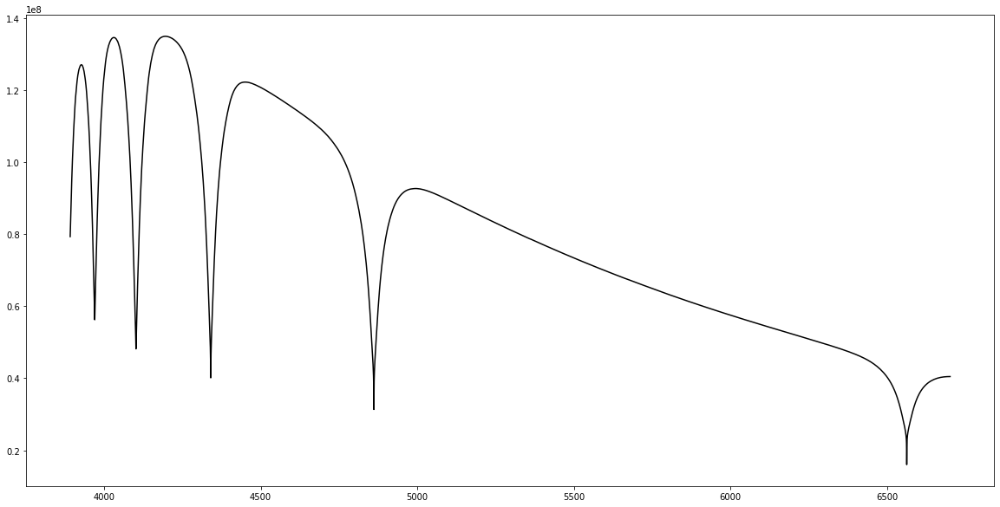

In [86]:
plt.figure(figsize=(20,10))
#plt.plot(newW,newF, 'r,')
start = 2500
end = -750
plt.plot(data['wave'][start:end], data['flux'][start:end], 'k')
#plt.xlim(4200,4500)
#plt.ylim(1.25e7,2.75e7)
#plt.plot([6562.801,6562.801],[1.25e7,2.75e7])

In [87]:

dat = np.vstack((data['wave'][start:end], data['flux'][start:end]))
dat = dat.T
np.savetxt('GD1400ModelDa.dat', dat, delimiter = '\t')

In [ ]:
data = pd.read_table('BT-Settl-1500-4-0.txt', header=None, names=['wave','flux'],delim_whitespace=True)

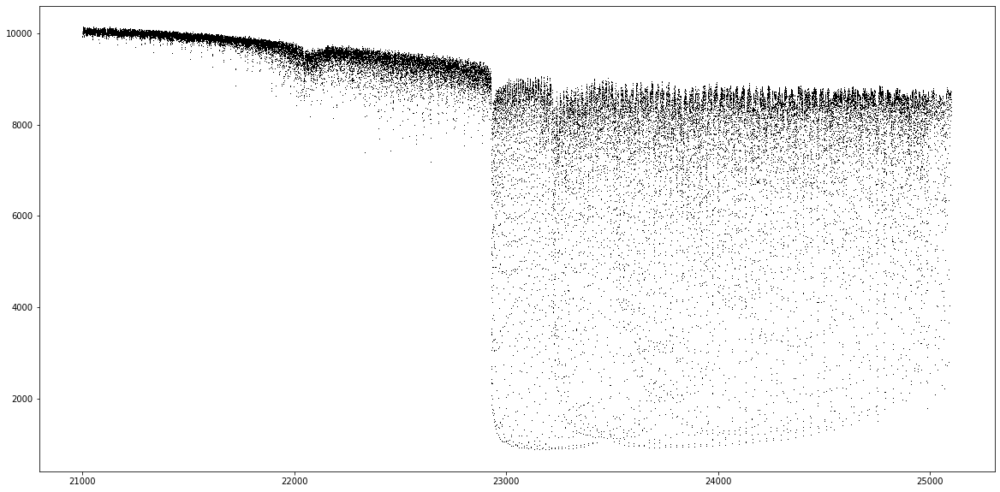

In [47]:
plt.figure(figsize=(20,10))
#plt.plot(newW,newF, 'r,')
plt.plot(data['wave'], data['flux'], 'k,')


In [48]:
data

,wave,flux
0,21000.1,9901.48
1,21000.2,9916.31
2,21000.3,9931.39
3,21000.4,9973.78
4,21000.5,9972.41
...,...,...
40460,25099.0,8484.57
40461,25099.2,8365.27
40462,25099.4,8208.43
40463,25099.6,8530.41


In [50]:
dataNew

,wave,flux
0,21000.0,9922.70
1,21000.1,9901.48
2,21000.2,9916.31
3,21000.3,9931.39
4,21000.4,9973.78
...,...,...
39962,24999.2,8452.01
39963,24999.4,8500.61
39964,24999.6,8409.88
39965,24999.8,8123.81


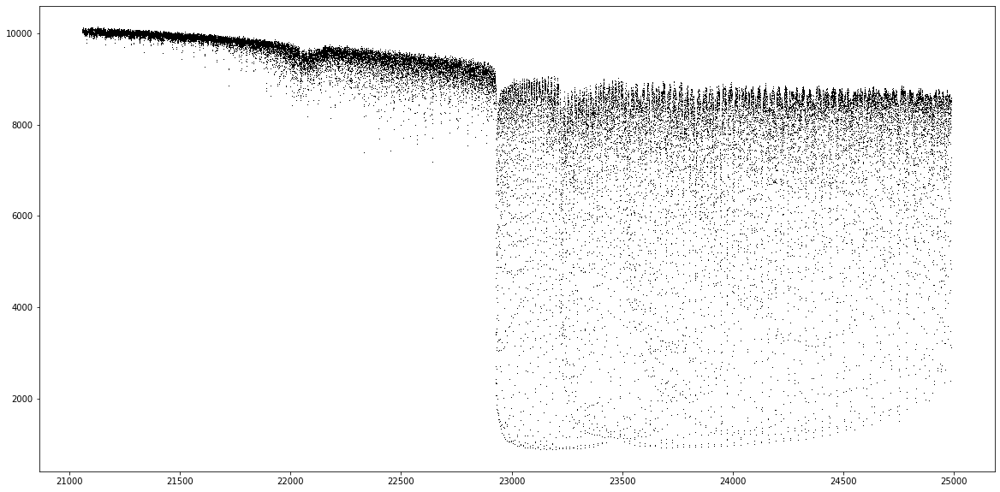

In [8]:
plt.figure(figsize=(20,10))
plt.plot(data['wave'][600:-600], data['flux'][600:-600], 'k,')

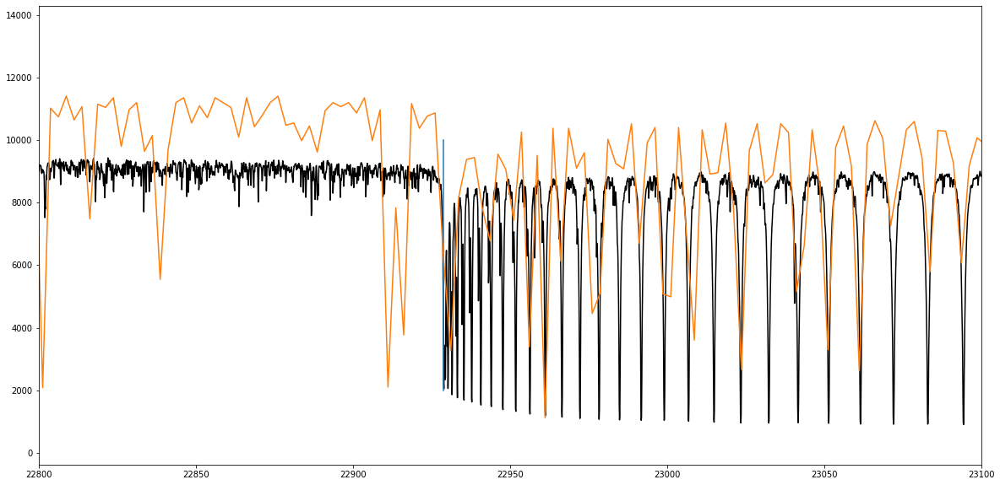

In [60]:
plt.figure(figsize=(20,10))
plt.plot(data['wave'][600:-600], data['flux'][600:-600], 'k-')
plt.xlim(22800,23100)
plt.plot([22928.95,22928.95],[2000,10000])
plt.plot(testW,testF)

In [16]:
waveKeep = data['wave'][600:-600]
print(waveKeep)
waveKeep = vactoair(waveKeep)
print(waveKeep)
fluxKeep = data['flux'][600:-600]

600      21060.1
601      21060.2
602      21060.3
603      21060.4
604      21060.5
          ...   
39860    24986.1
39861    24986.2
39862    24986.3
39863    24986.4
39864    24986.5
Name: wave, Length: 39265, dtype: float64
600      21054.352871
601      21054.452844
602      21054.552817
603      21054.652790
604      21054.752762
             ...     
39860    24979.284005
39861    24979.383978
39862    24979.483951
39863    24979.583924
39864    24979.683896
Name: wave, Length: 39265, dtype: float64


(23000, 23100)

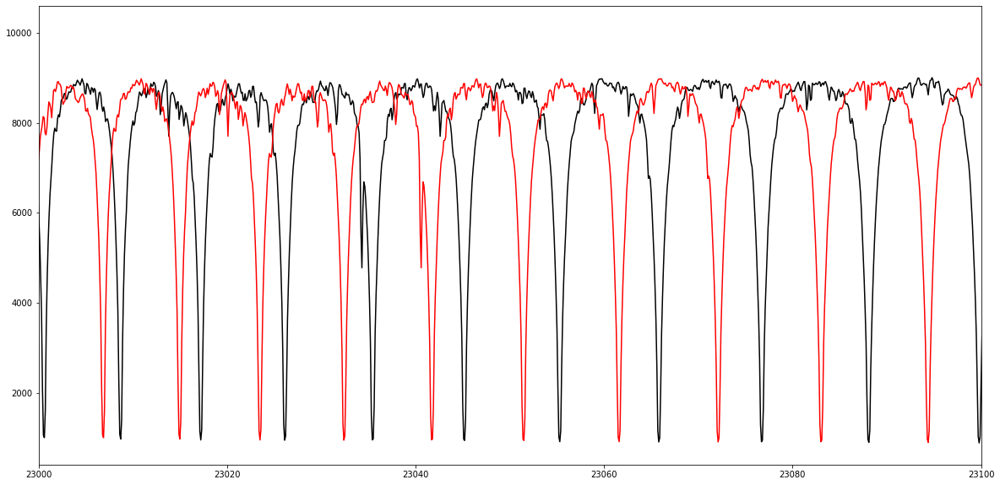

In [17]:
plt.figure(figsize=(20,10))
plt.plot(waveKeep, fluxKeep, 'k-')
dat = np.vstack((waveKeep, fluxKeep))
dat = dat.T
np.savetxt('PhoenixAir.dat', dat, delimiter = '\t')
plt.plot(data['wave'][600:-600], data['flux'][600:-600], 'r-')
plt.xlim(23000,23100)

In [ ]:
+-14.666666666667A
0.4158d


In [11]:
0.4158/2 #gives 14.667 shift

0.2079

In [13]:
10/60/24

0.006944444444444444

In [15]:
(0.006944444444444444/0.2079)*14.667

0.4899190315856982

In [33]:
data['wave'][1]-data['wave'][0]

0.10000000000218279

In [35]:
len(data['flux'][0:-5])

40460

In [5]:
averages = np.zeros(40460)
for i in range(5):
    toAdd  = data['flux'][i:-5+i]
    toAdd = np.array(toAdd)
    averages = averages + toAdd

In [6]:
len(averages)

40460

(22950, 23000)

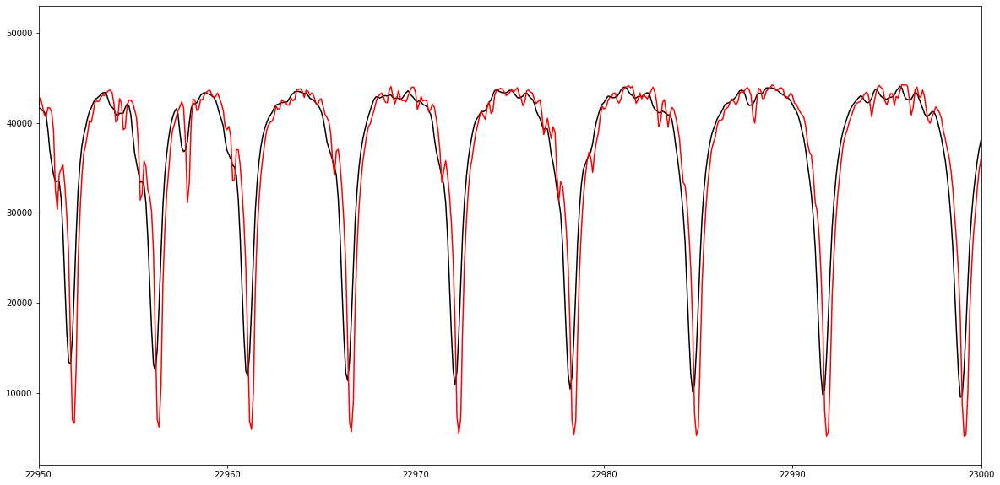

In [7]:
plt.figure(figsize=(20,10))
plt.plot(data['wave'][:-5],averages,'k')
plt.plot(data['wave'][600:-600], data['flux'][600:-600]*5, 'r')
plt.xlim(22950,23000)

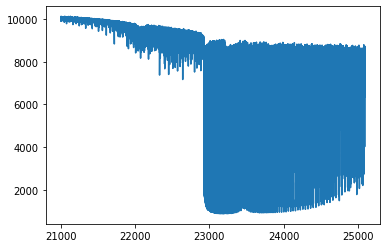

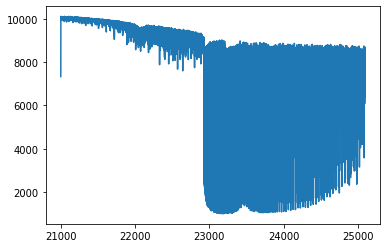

In [8]:
f, ax = plt.subplots()  
ax.step(data['wave'], data['flux']) 

fluxTest = data['flux']
from astropy.convolution import convolve, Gaussian1DKernel

gauss_kernel = Gaussian1DKernel(0.83)
fluxTestS = convolve(fluxTest, gauss_kernel)

plt.show()
plt.plot(data['wave'],fluxTestS)

In [8]:
import sys
!{sys.executable} -m pip install pysynphot

  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Installing backend dependencies: started
  Installing backend dependencies: finished with status 'done'
    Preparing wheel metadata: started
    Preparing wheel metadata: finished with status 'done'
  Created wheel for pysynphot: filename=pysynphot-1.0.0-cp37-cp37m-win_amd64.whl size=6685743 sha256=48ba1bc79db2c3c4f00b1bd1cd0c9552179ac4b43a8eb218ce560c643ad04425
  Stored in directory: c:\users\admin\appdata\local\pip\cache\wheels\45\54\e5\ded461804aa36e39001f9bfc4867261b47834c437a3c85e69d
Successfully built pysynphot


In [5]:
from specutils.manipulation import FluxConservingResampler, LinearInterpolatedResampler, SplineInterpolatedResampler
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA

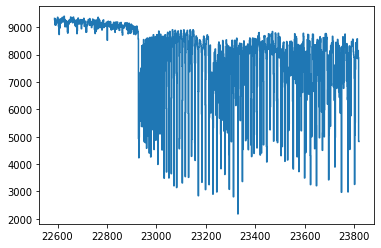

In [6]:
fluxcon = FluxConservingResampler()
from specutils import Spectrum1D
fluxx = np.array(data['flux']) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = np.array(data['wave'])* u.AA
input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots()  

ax.step(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux) 


(23200, 23400)

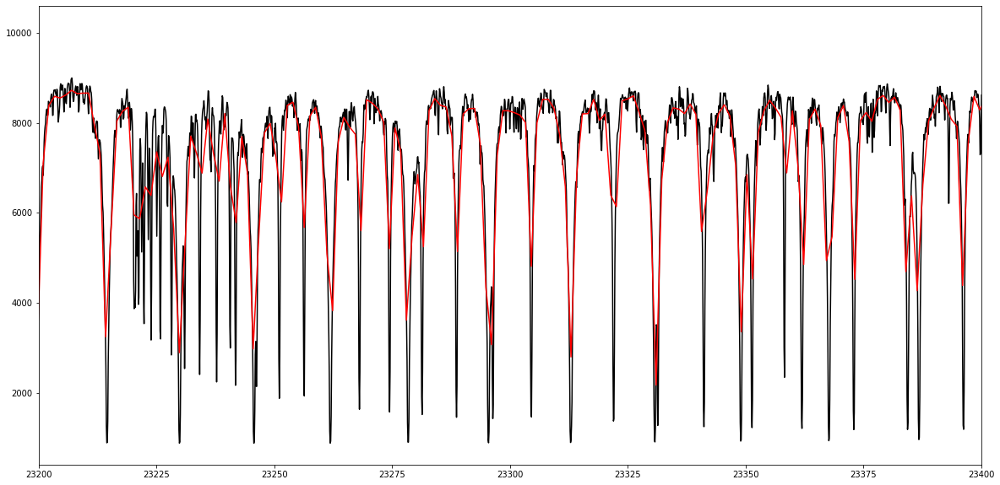

In [9]:
plt.figure(figsize=(20,10))

plt.plot(data['wave'], data['flux'],c='k')
plt.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux,c='r')
plt.xlim(23200,23400)

In [12]:
type(wavel)

specutils.spectra.spectral_axis.SpectralAxis

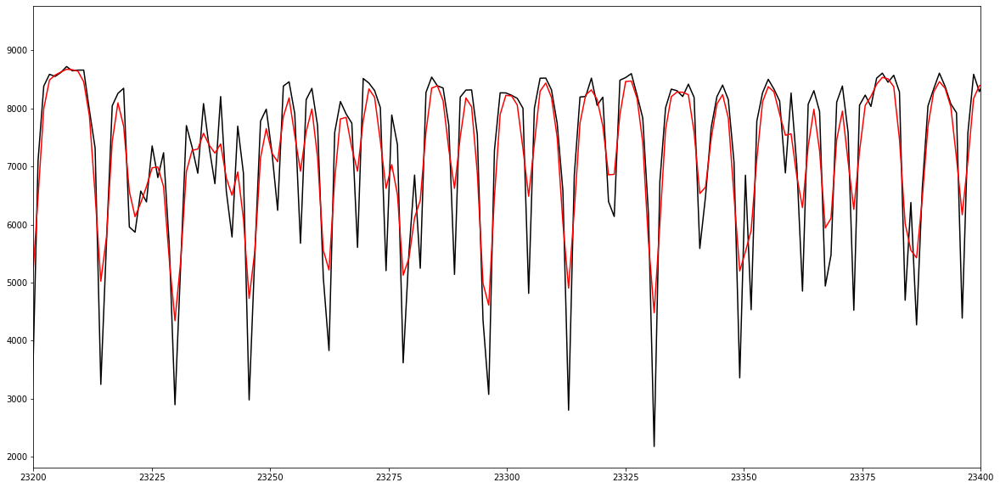

In [13]:
wavel = new_spec_fluxcon.spectral_axis
flux = new_spec_fluxcon.flux
len(wavel.value.tolist())


fluxTestS = convolve(flux, gauss_kernel)

plt.figure(figsize=(20,10))

plt.plot(wavel, flux,c='k')
plt.plot(wavel, fluxTestS,c='r')
plt.xlim(23200,23400)

dat = np.vstack((wavel.value.tolist(), fluxTestS))
dat = dat.T
np.savetxt('PhoenixResampledGauss.dat', dat, delimiter = '\t')


In [17]:
help(new_spec_fluxcon.spectral_axis)

Help on SpectralAxis in module specutils.spectra.spectral_axis object:

class SpectralAxis(specutils.extern.spectralcoord.spectral_coordinate.SpectralCoord)
 |  SpectralAxis(value, *args, bin_specification='centers', **kwargs)
 |  
 |  Coordinate object representing spectral values corresponding to a specific
 |  spectrum. Overloads SpectralCoord with additional information (currently
 |  only bin edges).
 |  
 |  Parameters
 |  ----------
 |  bin_specification: str, optional
 |      Must be "edges" or "centers". Determines whether specified axis values
 |      are interpreted as bin edges or bin centers. Defaults to "centers".
 |  
 |  Method resolution order:
 |      SpectralAxis
 |      specutils.extern.spectralcoord.spectral_coordinate.SpectralCoord
 |      specutils.extern.spectralcoord.spectral_quantity.SpectralQuantity
 |      astropy.units.quantity.SpecificTypeQuantity
 |      astropy.units.quantity.Quantity
 |      numpy.ndarray
 |      builtins.object
 |  
 |  Methods defined

In [14]:
from astropy.nddata import CCDData
CCDData.write.list_formats()

Format Read Write Auto-identify
------ ---- ----- -------------
  fits  Yes   Yes           Yes


In [13]:
new_spec_fluxcon.write('PhoenixResampled',format="ASCII")

IORegistryError: No writer defined for format 'ASCII' and class 'Spectrum1D'.

The available formats are:

   Format    Read Write Auto-identify
------------ ---- ----- -------------
tabular-fits  Yes   Yes           Yes
  wcs1d-fits  Yes   Yes           Yes

(22600, 23800)

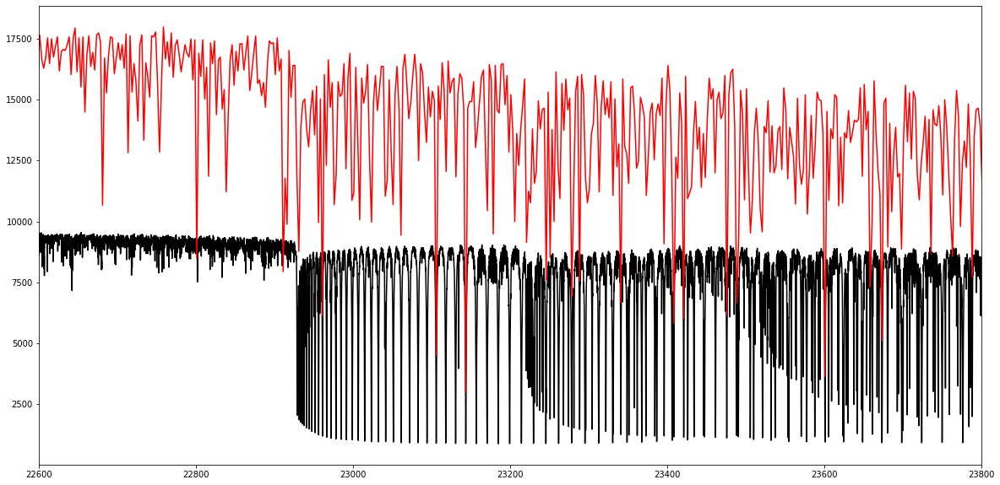

In [60]:


data2 = pd.read_table('BT-Settl-1700-4-0.txt', header=None, names=['wave','flux'],delim_whitespace=True)

plt.figure(figsize=(20,10))
plt.plot(data['wave'], data['flux'], 'k')
plt.plot(data2['wave'], data2['flux'], 'r')
plt.xlim(22600,23800)

In [13]:
import pysynphot as S
from astropy.convolution import convolve_fft
from astropy.convolution import Gaussian1DKernel

def smear(sp, R, w_sample=1):
    '''
    Smears a model spectrum with a gaussian kernel to the given resolution, R.

    Parameters
    -----------

    sp: SourceSpectrum
        Pysynphot object that we willsmear

    R: int
        The resolution (dL/L) to smear to

    w_sample: int
        Oversampling factor for smoothing

    Returns
    -----------

    sp: PySynphot Source Spectrum
        The smeared spectrum
    '''

    # Save original wavelength grid and units
    w_grid = sp.wave
    w_units = sp.waveunits
    f_units = sp.fluxunits
    sp_name = sp.name

    # Generate logarithmic wavelength grid for smoothing
    w_logmin = np.log10(np.nanmin(w_grid))
    w_logmax = np.log10(np.nanmax(w_grid))
    n_w = np.size(w_grid)*w_sample
    w_log = np.logspace(w_logmin, w_logmax, num=n_w)

    # Find stddev of Gaussian kernel for smoothing
    R_grid = (w_log[1:-1]+w_log[0:-2])/(w_log[1:-1]-w_log[0:-2])/2
    sigma = np.median(R_grid)/R
    if sigma < 1:
        sigma = 1

    # Interpolate on logarithmic grid
    f_log = np.interp(w_log, w_grid, sp.flux)

    # Smooth convolving with Gaussian kernel
    gauss = Gaussian1DKernel(stddev=sigma)
    f_conv = convolve_fft(f_log, gauss)

    # Interpolate back on original wavelength grid
    f_sm = np.interp(w_grid, w_log, f_conv)

    # Write smoothed spectrum back into Spectrum object
    return S.ArraySpectrum(w_grid, f_sm, waveunits=w_units,
                            fluxunits=f_units, name=sp_name)

D:\conda\lib\site-packages\pysynphot\locations.py:46: UserWarning: PYSYN_CDBS is undefined; functionality will be SEVERELY crippled.
  warnings.warn("PYSYN_CDBS is undefined; functionality will be SEVERELY "
D:\conda\lib\site-packages\pysynphot\locations.py:345: UserWarning: Extinction files not found in extinction
  warnings.warn('Extinction files not found in %s' % (extdir, ))
D:\conda\lib\site-packages\pysynphot\refs.py:118: UserWarning: No graph or component tables found; functionality will be SEVERELY crippled. No files found for https://ssb.stsci.edu/trds\mtab\*_tmg.fits
  'functionality will be SEVERELY crippled. ' + str(e))
D:\conda\lib\site-packages\pysynphot\refs.py:125: UserWarning: No thermal tables found, no thermal calculations can be performed. No files found for https://ssb.stsci.edu/trds\mtab\*_tmt.fits
  'no thermal calculations can be performed. ' + str(e))


In [25]:
w = data['wave']
w = np.array(w)
f = data['flux']
f = np.array(f)

input_spec = S.ArraySpectrum(w, f, name='MySource')
newSpec = smear(input_spec,19200/2,500)

(22950, 23000)

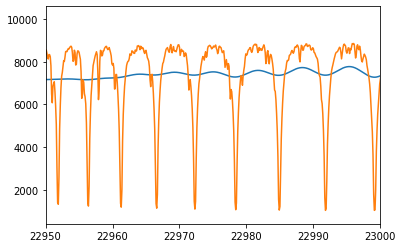

In [26]:
plt.plot(newSpec.wave,newSpec.flux)
plt.plot(w,f)
plt.xlim(22950,23000)

In [24]:
len(newSpec.wave)

40465

Text(0.5, 1.0, 'Log g = 4.0')

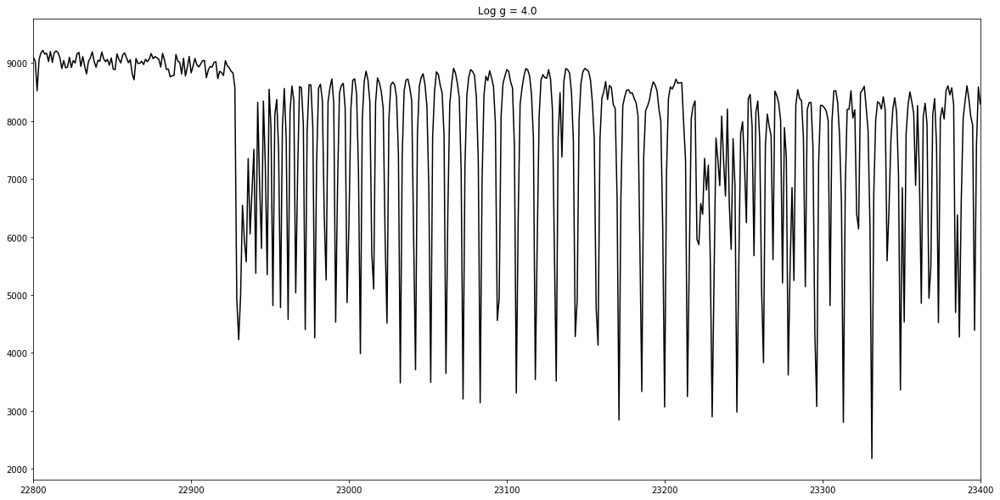

In [49]:
from astropy.io import fits
from astropy import units as u
import numpy as np
from matplotlib import pyplot as plt
from astropy.visualization import quantity_support
from specutils.manipulation import FluxConservingResampler, LinearInterpolatedResampler, SplineInterpolatedResampler
from specutils import Spectrum1D
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('UpdatedPhoenix.txt', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()

fluxx = np.array(data['flux']) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = np.array(data['wave'])* u.AA
input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 4.0')
#plt.figure(figsize=(20,10))
#plt.plot(data['wave'], data['flux'], 'k')
#plt.xlim(22800,23400)

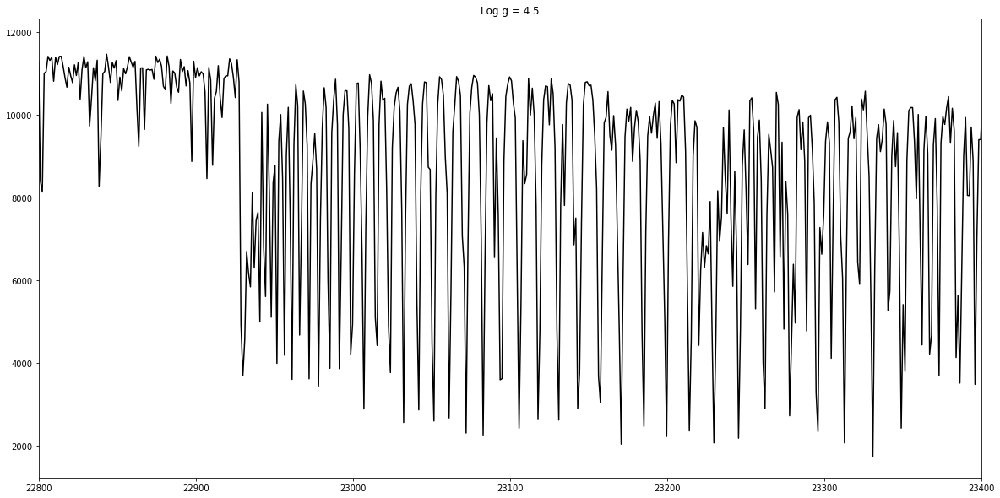

In [12]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('phoenix4.5.txt', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
fluxx = np.array(data['flux']) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = np.array(data['wave'])* u.AA
input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 4.5')
#plt.figure(figsize=(20,10))
#plt.plot(data['wave'], data['flux'], 'k')
#plt.xlim(22800,23400)

phoenixWav = new_spec_fluxcon.spectral_axis
phoenixFlu = new_spec_fluxcon.flux

Text(0.5, 1.0, 'Log g = 5.0')

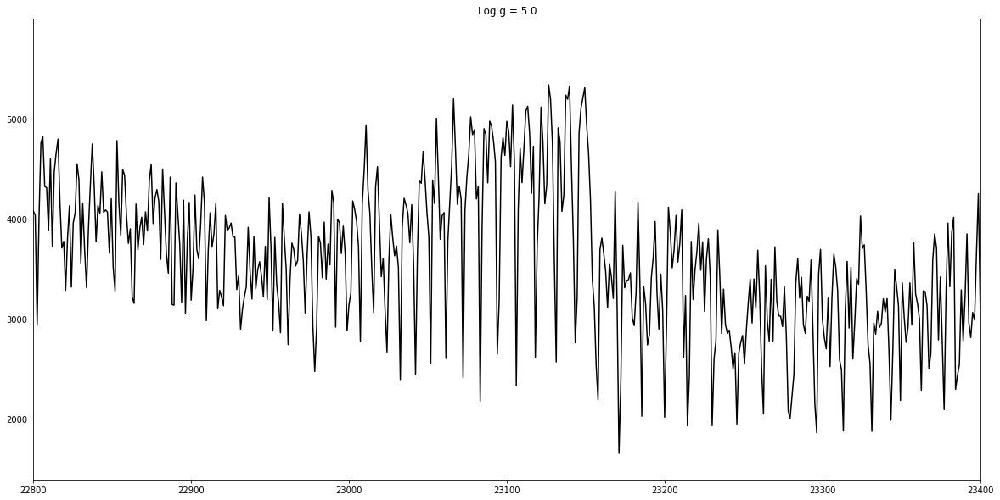

In [47]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('phoenix5.0.txt', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
fluxx = np.array(data['flux']) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = np.array(data['wave'])* u.AA
input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 5.0')
#plt.figure(figsize=(20,10))
#plt.plot(data['wave'], data['flux'], 'k')
#plt.xlim(22800,23400)

(22800, 23400)

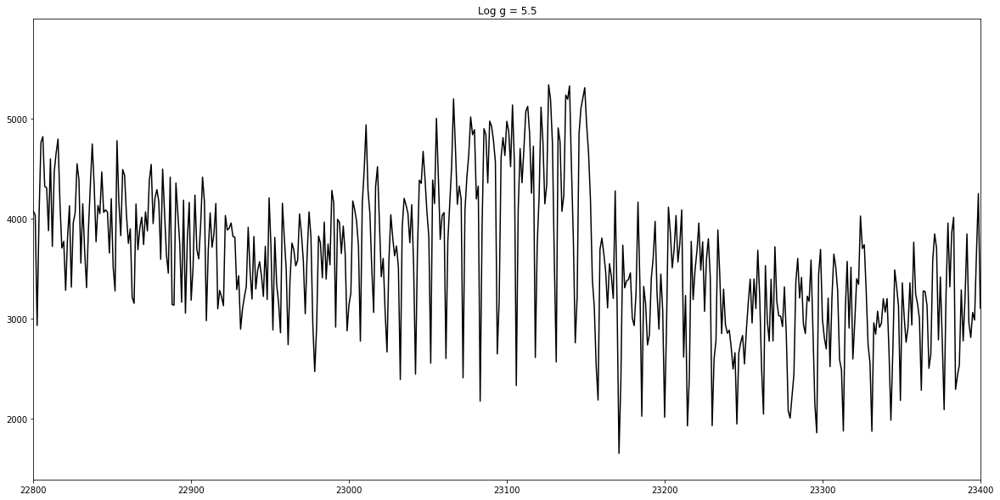

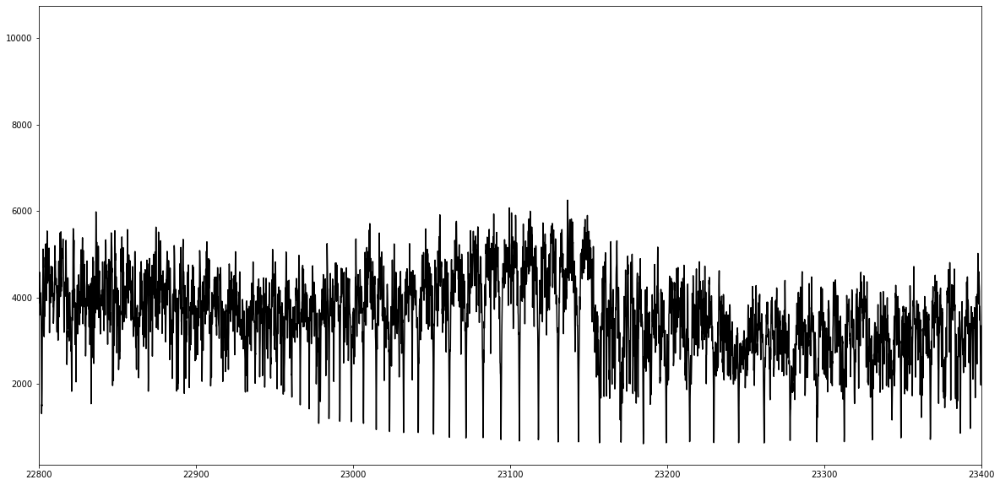

In [74]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('phoenix5.0.txt', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
fluxx = np.array(data['flux']) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = np.array(data['wave'])* u.AA
input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 5.5')
plt.figure(figsize=(20,10))
plt.plot(data['wave'], data['flux'], 'k')
plt.xlim(22800,23400)

In [12]:
print(wavve[1]-wavve[0])
print((new_disp_grid[1]-new_disp_grid[0])/(wavve[1]-wavve[0]))

0.10499999999956344 Angstrom
11.469534050216467


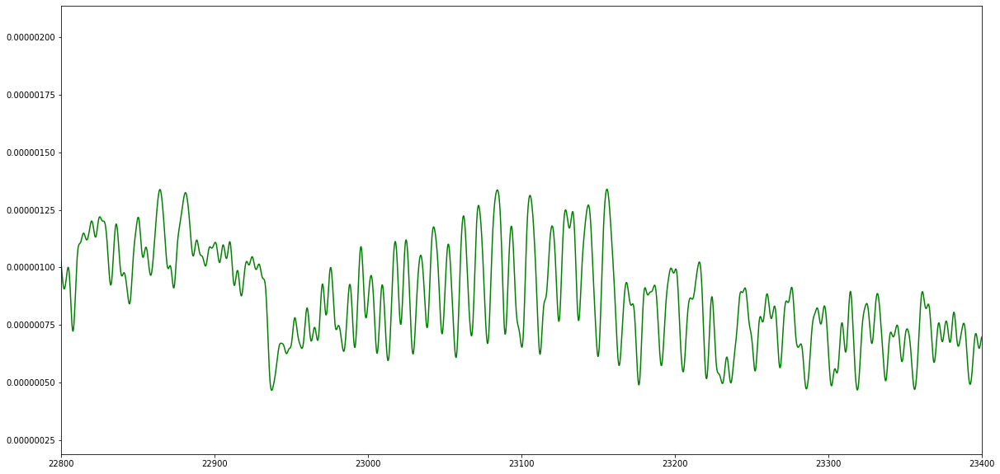

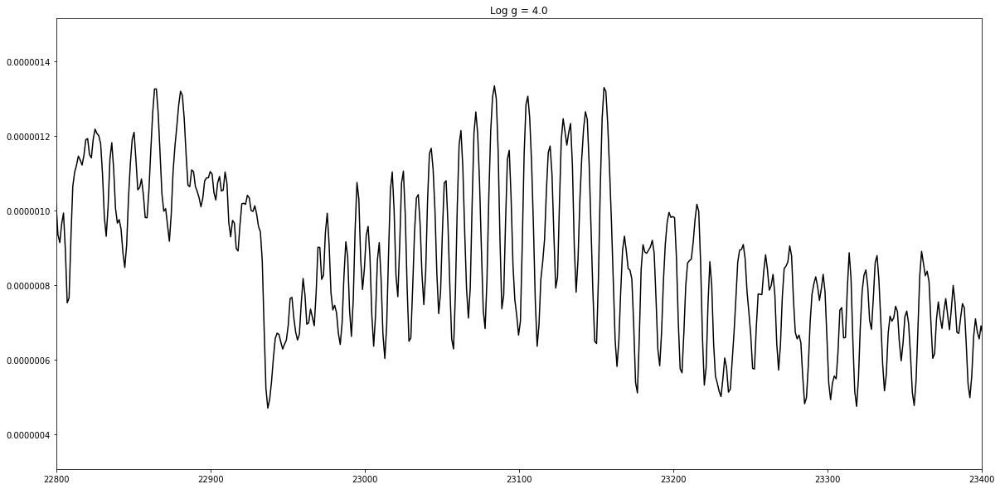

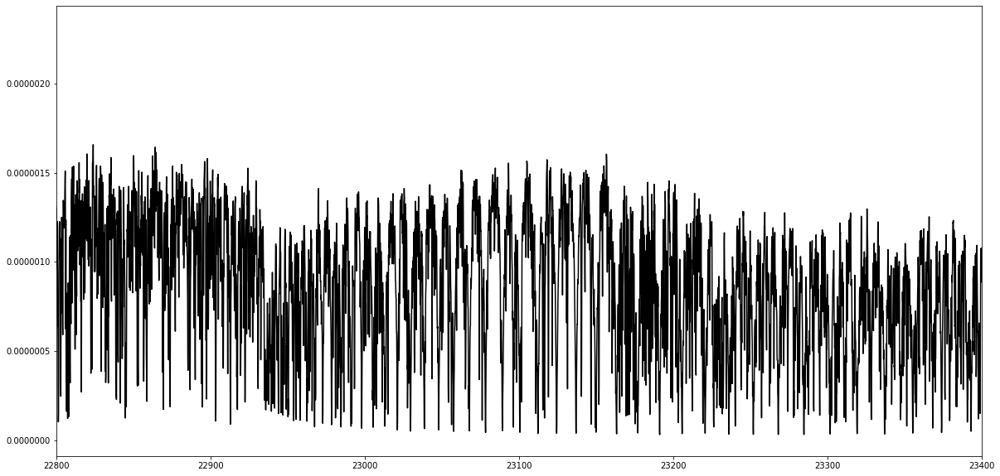

In [18]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('sp_t1500g100nc_m0.0', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
fluxx  = np.array(np.flip(data['flux'])) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = 10000*np.flip(np.array(data['wave']))* u.AA

fluxUnitless = np.array(np.flip(data['flux']))
waveUnitless = 10000*np.flip(np.array(data['wave']))

#Quick demo of convolving a spectrum to a given spectral resolution


#Setup
R = 8900 #R = lambda / deltaLambda
referenceWavelength = 23000
oversample = 11  #points per deltaLambda at reference wavelength


#Convolve over Gaussian kernel
deltaLambda = referenceWavelength / R
width = deltaLambda / 2 / 0.10499999999956344 #R is the FWHM, but the Gaussian stdev is approximately the half-width
kernel = Gaussian1DKernel(width)
convolvedFlux = convolve(fluxUnitless, kernel)

#Downsample to generate output
interpolator = interp1d(x=waveUnitless, y=convolvedFlux, kind='linear')
outputWavelength = np.arange(min(waveUnitless), max(waveUnitless), deltaLambda/oversample)
outputFlux = interpolator(outputWavelength)

plt.figure(figsize=(20,10))
plt.plot(outputWavelength, outputFlux, c='g')
plt.xlim(22800,23400)
plt.show()

fluxx = outputFlux * u.Unit('erg cm-2 s-1 AA-1') 
wavve = outputWavelength* u.AA

input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 4.0')
plt.figure(figsize=(20,10))
plt.plot(10000*data['wave'], data['flux'], 'k')
plt.xlim(22800,23400)



dat = np.vstack((new_spec_fluxcon.spectral_axis.value.tolist(), new_spec_fluxcon.flux.value.tolist()))
dat = dat.T
np.savetxt('SonoraDown.dat', dat, delimiter = '\t')

In [20]:
type(new_spec_fluxcon.spectral_axis)

specutils.spectra.spectral_axis.SpectralAxis

(22800, 23400)

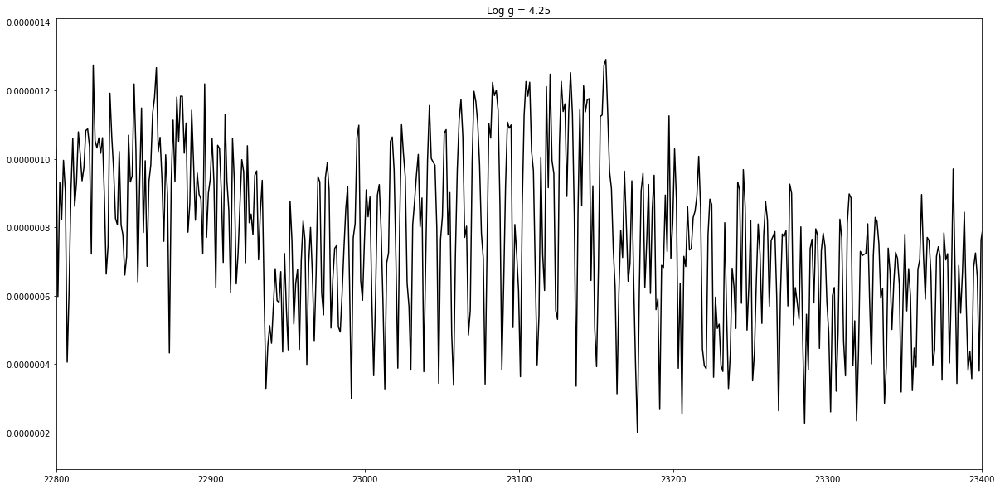

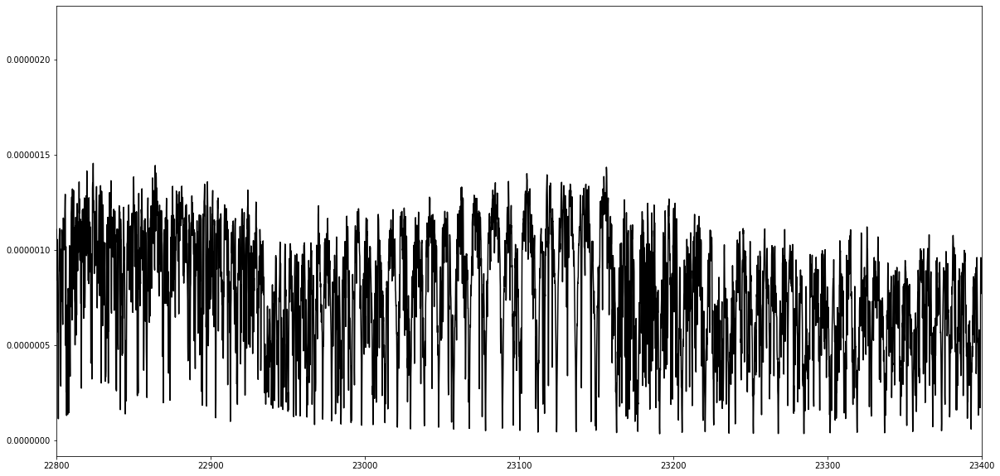

In [6]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('sp_t1500g178nc_m0.0', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
fluxx = np.array(np.flip(data['flux'])) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = 10000*np.flip(np.array(data['wave']))* u.AA
input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 4.25')
plt.figure(figsize=(20,10))
plt.plot(10000*data['wave'], data['flux'], 'k')
plt.xlim(22800,23400)

(22800, 23400)

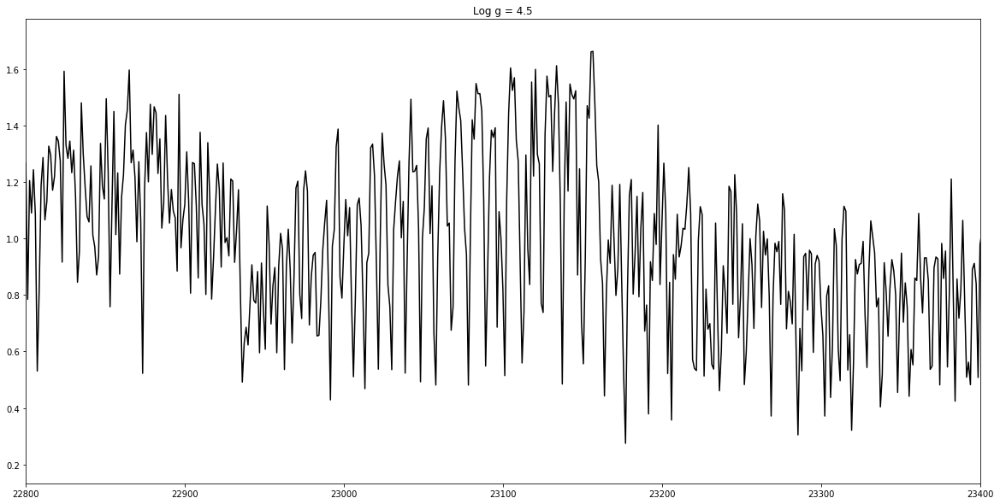

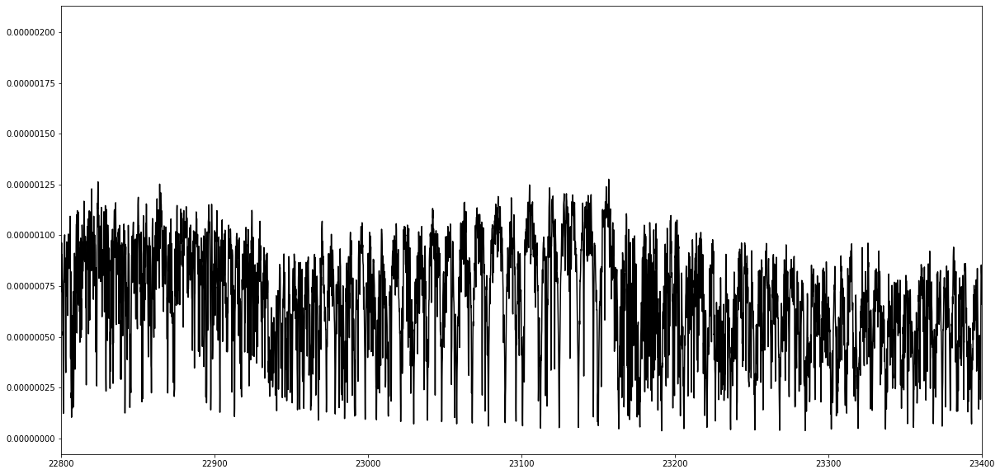

In [15]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('sp_t1500g316nc_m0.0', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
fluxx = np.array(np.flip(data['flux'])) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = 10000*np.flip(np.array(data['wave']))* u.AA
input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux/np.mean(new_spec_fluxcon.flux), c='k')

#ax.plot(phoenixWav,phoenixFlu/np.mean(phoenixFlu), c='r')

ax.set_xlim(22800,23400)
ax.set_title('Log g = 4.5')
plt.figure(figsize=(20,10))
plt.plot(10000*data['wave'], data['flux'], 'k')
plt.xlim(22800,23400)

(22800, 23400)

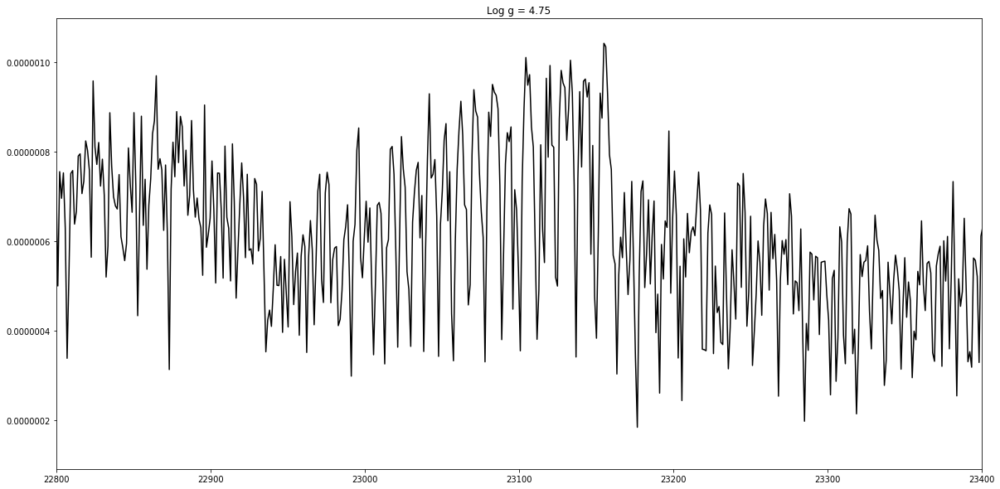

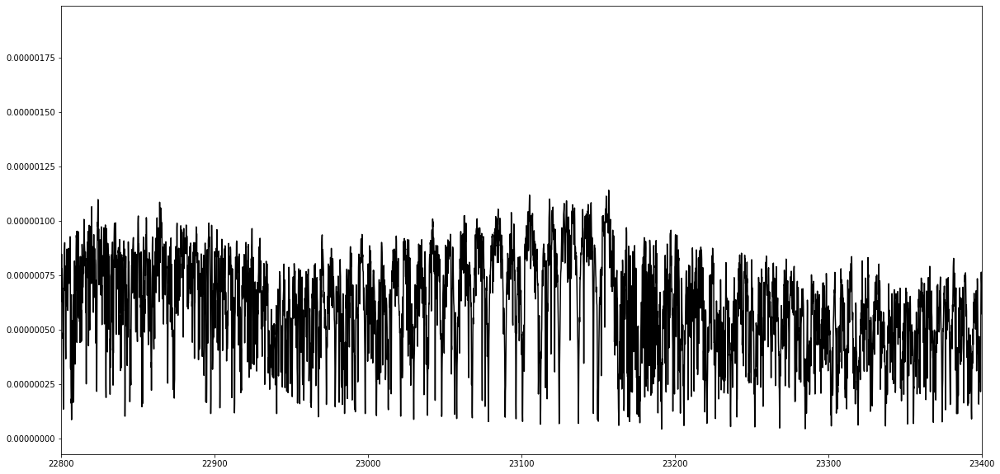

In [8]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('sp_t1500g562nc_m0.0', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
fluxx = np.array(np.flip(data['flux'])) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = 10000*np.flip(np.array(data['wave']))* u.AA
input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 4.75')
plt.figure(figsize=(20,10))
plt.plot(10000*data['wave'], data['flux'], 'k')
plt.xlim(22800,23400)

(22800, 23400)

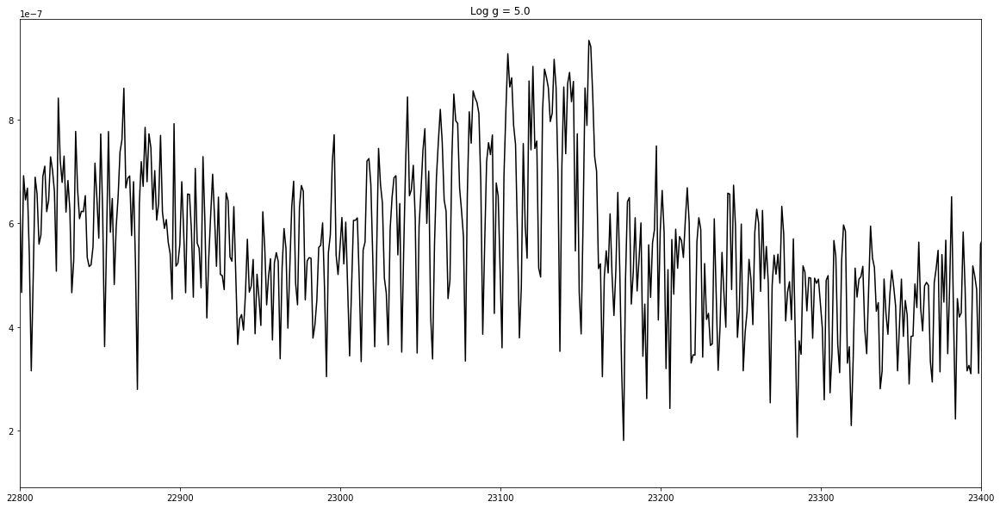

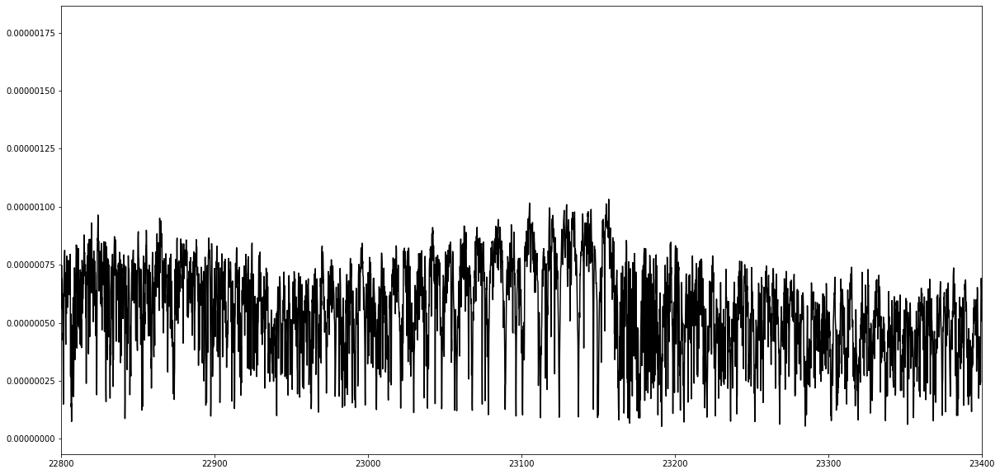

In [9]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('sp_t1500g1000nc_m0.0', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
fluxx = np.array(np.flip(data['flux'])) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = 10000*np.flip(np.array(data['wave']))* u.AA
input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 5.0')
plt.figure(figsize=(20,10))
plt.plot(10000*data['wave'], data['flux'], 'k')
plt.xlim(22800,23400)

(22800, 23400)

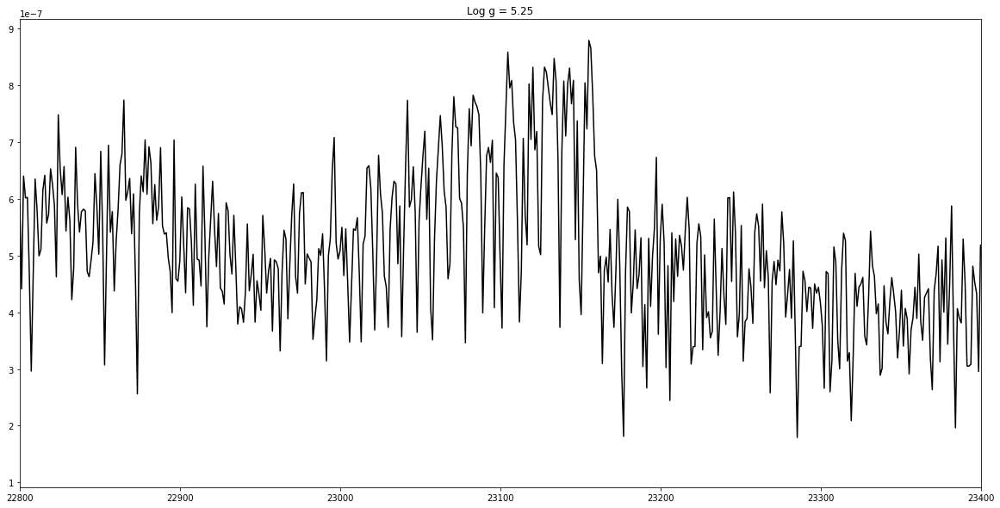

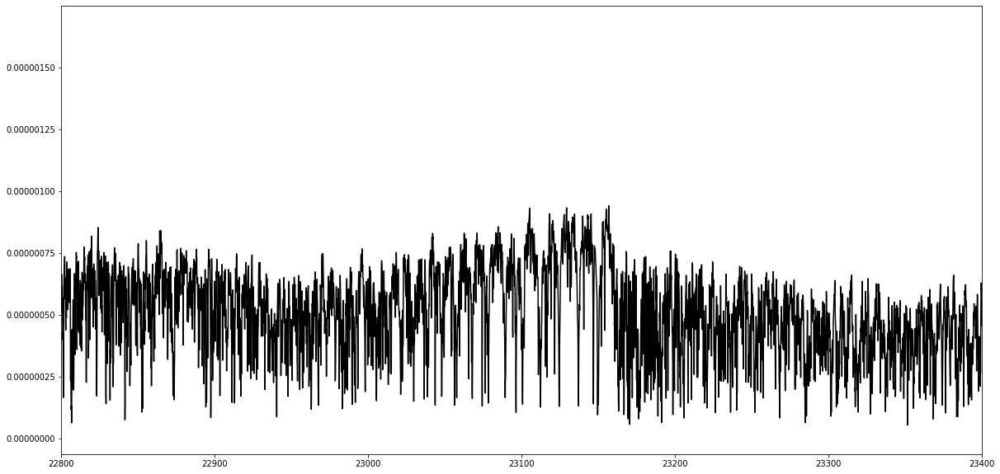

In [10]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('sp_t1500g1780nc_m0.0', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
fluxx = np.array(np.flip(data['flux'])) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = 10000*np.flip(np.array(data['wave']))* u.AA
input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 5.25')
plt.figure(figsize=(20,10))
plt.plot(10000*data['wave'], data['flux'], 'k')
plt.xlim(22800,23400)

(22800, 23400)

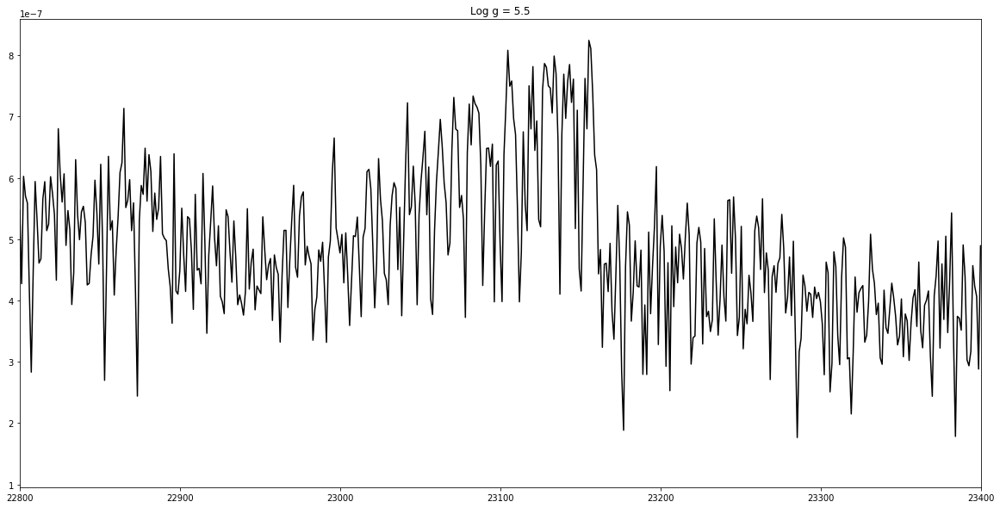

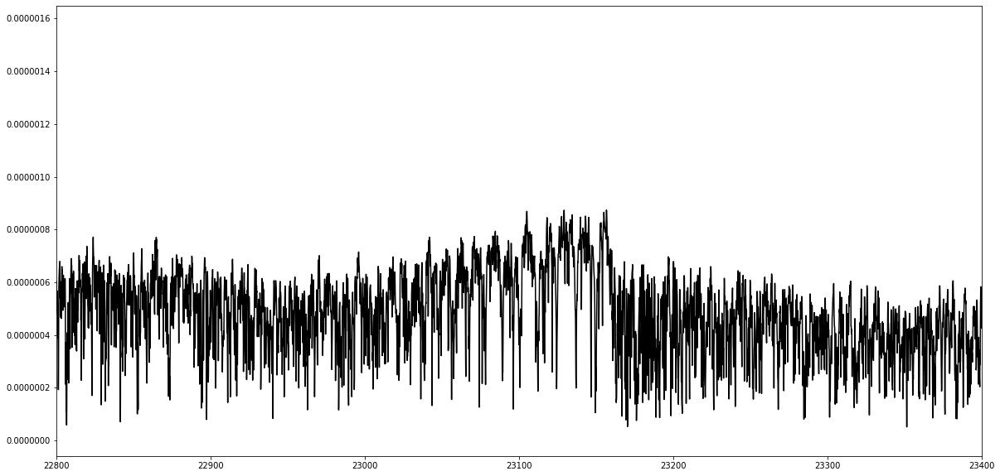

In [11]:
new_disp_grid = np.linspace(22588, 23820, 1024) * u.AA
data = pd.read_table('sp_t1500g3160nc_m0.0', header=None, names=['wave','flux'],delim_whitespace=True)

fluxcon = FluxConservingResampler()
fluxx = np.array(np.flip(data['flux'])) * u.Unit('erg cm-2 s-1 AA-1') 
wavve = 10000*np.flip(np.array(data['wave']))* u.AA
input_spec = Spectrum1D(spectral_axis=wavve, flux=fluxx) 
new_spec_fluxcon = fluxcon(input_spec, new_disp_grid) 
f, ax = plt.subplots(figsize=(20,10))  

ax.plot(new_spec_fluxcon.spectral_axis, new_spec_fluxcon.flux, c='k')
ax.set_xlim(22800,23400)
ax.set_title('Log g = 5.5')
plt.figure(figsize=(20,10))
plt.plot(10000*data['wave'], data['flux'], 'k')
plt.xlim(22800,23400)